# Oral_Lesions_Malignancy_Detection

In [32]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [33]:
# -----------------------------------------------------------
# 1. Download (or re-use) the dataset and get its root folder
# -----------------------------------------------------------
import kagglehub
from pathlib import Path
import pandas as pd
from PIL import Image

# This returns the local cache path
dataset_root = Path(
    kagglehub.dataset_download(
        "mohamedgobara/oral-lesions-malignancy-detection-dataset"
    )
)
print(f"✔ Dataset cached at: {dataset_root}")

# -----------------------------------------------------------
# 2. Point to the two class folders you want to use
#    (original_data vs augmented_data — pick whichever you need)
# -----------------------------------------------------------
# ⚠️ Change this to "original_data" if you prefer the non-augmented images
SUBFOLDER = "augmented_data"

benign_dir    = dataset_root / "Oral Images Dataset" / SUBFOLDER / "augmented_benign"
malignant_dir = dataset_root / "Oral Images Dataset" / SUBFOLDER / "augmented_malignant"

for d in (benign_dir, malignant_dir):
    if not d.exists():
        raise FileNotFoundError(f"Expected directory not found → {d}")

# -----------------------------------------------------------
# 3. Helper: check if a file is a valid image
# -----------------------------------------------------------
def is_image(fp):
    try:
        Image.open(fp).verify()
        return True
    except Exception:
        return False

# -----------------------------------------------------------
# 4. Build a dataframe of filepaths + labels
# -----------------------------------------------------------
filepaths, labels = [], []
class_map = [(benign_dir,    "Oral lesions benign"),
             (malignant_dir, "Oral lesions malignant")]

for folder, label in class_map:
    for fp in folder.iterdir():
        if fp.is_file() and is_image(fp):
            filepaths.append(str(fp))
            labels.append(label)

oral_df = pd.DataFrame({"filepaths": filepaths, "labels": labels})
print(oral_df.head(3))
print("\nClass counts:\n", oral_df["labels"].value_counts())


✔ Dataset cached at: /kaggle/input/oral-lesions-malignancy-detection-dataset
                                           filepaths               labels
0  /kaggle/input/oral-lesions-malignancy-detectio...  Oral lesions benign
1  /kaggle/input/oral-lesions-malignancy-detectio...  Oral lesions benign
2  /kaggle/input/oral-lesions-malignancy-detectio...  Oral lesions benign

Class counts:
 labels
Oral lesions benign       1155
Oral lesions malignant    1115
Name: count, dtype: int64


In [35]:
import pandas as pd
import numpy as np
import keras
import warnings
warnings.filterwarnings(action="ignore")
import matplotlib.pyplot as plt
%matplotlib inline

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

from tensorflow.keras.callbacks import TensorBoard,EarlyStopping

import sklearn.metrics as metrics
from keras.callbacks import LearningRateScheduler

# annealer = LearningRateScheduler(lambda x: 1e-3 * 0.95 ** x, verbose=0)

In [36]:
oral_df.shape

(2270, 2)

In [37]:
train_images, test_images = train_test_split(oral_df, test_size=0.3, random_state=42)
train_set, val_set = train_test_split(oral_df, test_size=0.2, random_state=42)

In [38]:
print(train_set.shape)
print(test_images.shape)
print(val_set.shape)
print(train_images.shape)

(1816, 2)
(681, 2)
(454, 2)
(1589, 2)


In [39]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_gen = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input)

train = image_gen.flow_from_dataframe(
    dataframe=train_set,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=4,
    shuffle=True,
    seed=42
)

val = image_gen.flow_from_dataframe(
    dataframe=val_set,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=4,
    shuffle=False
)

test = image_gen.flow_from_dataframe(
    dataframe=test_images,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=4,
    shuffle=False
)


Found 1816 validated image filenames belonging to 2 classes.
Found 454 validated image filenames belonging to 2 classes.
Found 681 validated image filenames belonging to 2 classes.


In [40]:
classes=list(train.class_indices.keys())
print (classes)

['Oral lesions benign', 'Oral lesions malignant']


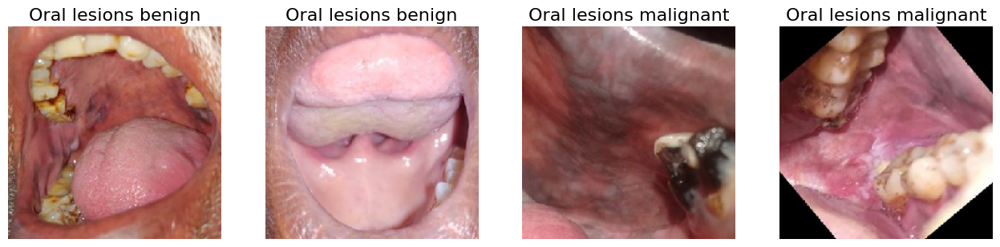

In [41]:
def show_knee_images(image_gen):
    test_dict = test.class_indices
    classes = list(test_dict.keys())
    images, labels=next(image_gen) # get a sample batch from the generator
    plt.figure(figsize=(20,20))
    length = len(labels)
    if length<25:
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5,5,i+1)
        image=(images[i]+1)/2 #scale images between 0 and 1
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name,fontsize=16)
        plt.axis('off')
    plt.show()
show_knee_images(train)

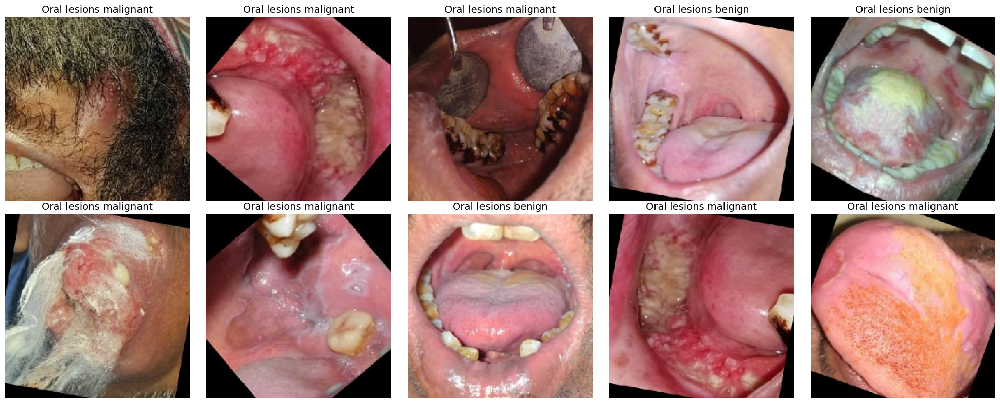

In [42]:
import matplotlib.pyplot as plt
import numpy as np

def show_knee_images(image_gen, total_images=10):
    """
    Display `total_images` from the generator (even if batch size is smaller).
    Layout: 2 rows × 5 columns.
    """
    class_indices = image_gen.class_indices
    idx_to_class = {v: k for k, v in class_indices.items()}

    images = []
    labels = []

    # Keep fetching batches until we collect enough images
    while len(images) < total_images:
        batch_imgs, batch_labels = next(image_gen)
        images.extend(batch_imgs)
        labels.extend(batch_labels)

    # Only use the first `total_images`
    images = images[:total_images]
    labels = labels[:total_images]

    plt.figure(figsize=(20, 8))
    for i in range(total_images):
        plt.subplot(2, 5, i + 1)
        img = (images[i] + 1) / 2.0  # rescale from [-1, 1] to [0, 1]
        plt.imshow(img)
        class_name = idx_to_class[np.argmax(labels[i])]
        plt.title(class_name, fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()



show_knee_images(train)         # 2 × 5 grid from your training generator



Found 1816 validated image filenames belonging to 2 classes.


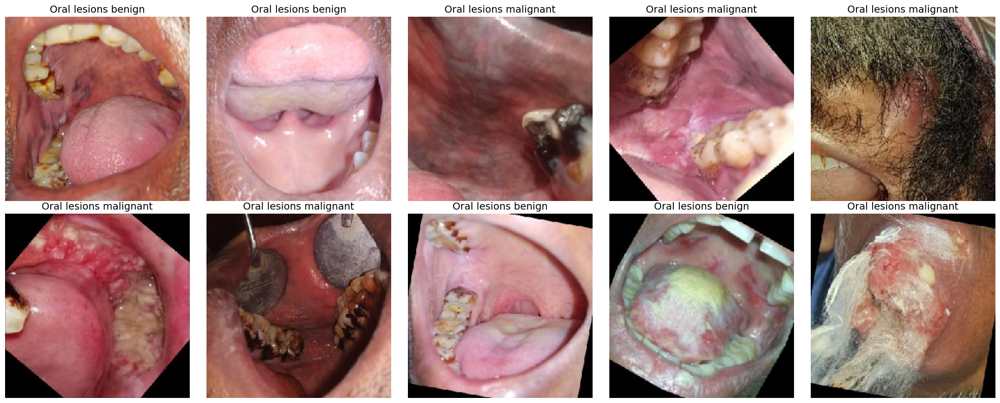

In [43]:
train = image_gen.flow_from_dataframe(
    dataframe=train_set,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=10,  # changed from 4 to 10
    shuffle=True,
    seed=42
)
show_knee_images(train)  # works with exactly 10 images now

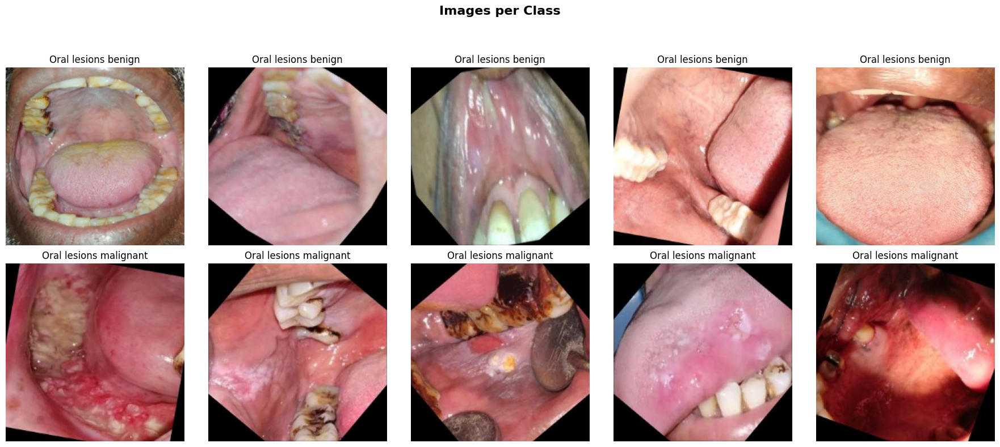

In [44]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

def show_classwise_images(df, class_names, title='Images per Class'):
    plt.figure(figsize=(18, 8))

    for row_idx, class_name in enumerate(class_names):
        # Get 5 random images from this class
        class_df = df[df['labels'] == class_name]
        # Sample up to 5 images, or all if less than 5
        num_samples = min(5, len(class_df))
        if num_samples > 0:
            sampled_df = class_df.sample(num_samples, random_state=42)
            filepaths = sampled_df['filepaths'].values
        else:
            filepaths = []


        for col_idx, filepath in enumerate(filepaths):
            img = cv2.imread(filepath)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (224, 224))  # match target size
            ax = plt.subplot(2, 5, row_idx * 5 + col_idx + 1)
            plt.imshow(img)
            plt.title(class_name, fontsize=12)
            plt.axis('off')

    plt.suptitle(title, fontsize=16, fontweight='bold')
    plt.subplots_adjust(hspace=0.5)  # <-- Adjust vertical space between rows
    plt.tight_layout(rect=[0, 0, 1, 0.93])  # Leave room for suptitle
    plt.show()

# Example usage
show_classwise_images(train_set, ['Oral lesions benign', 'Oral lesions malignant'])

In [45]:
import numpy as np
from PIL import Image
from sklearn.preprocessing import LabelEncoder

# Define the target size
target_size = (224, 224)

# Function to load and preprocess images
def load_images_from_dataframe(dataframe, target_size):
    images = []
    labels = []
    for index, row in dataframe.iterrows():
        filepath = row['filepaths'] # Assuming 'filepaths' is the column name
        label = row['labels']
        try:
            img = Image.open(filepath).convert('RGB')
            img = img.resize(target_size)
            img_array = np.array(img)
            images.append(img_array)
            labels.append(label)
        except FileNotFoundError:
            print(f"Warning: Image file not found at {filepath}. Skipping.")
            continue
        except Exception as e:
            print(f"Warning: Could not load or process image at {filepath}: {e}. Skipping.")
            continue

    return np.array(images), np.array(labels)

# Load data for each set
print("Loading training images and labels...")
x_train, y_train = load_images_from_dataframe(train_set, target_size)

print("Loading validation images and labels...")
x_val, y_val = load_images_from_dataframe(val_set, target_size)

print("Loading test images and labels...")
x_test, y_test = load_images_from_dataframe(test_images, target_size)

# Encode string labels to integers
# Find all unique labels across all sets to ensure consistent encoding
all_labels = np.concatenate((y_train, y_val, y_test))
label_encoder = LabelEncoder()
label_encoder.fit(all_labels)

y_train_encoded = label_encoder.transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)


print("\nShapes of the loaded data:")
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_val shape:", x_val.shape)
print("y_val shape:", y_val.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

print("\nExample of encoded labels:")
print("Original y_train labels (first 5):", y_train[:5])
print("Encoded y_train labels (first 5):", y_train_encoded[:5])
print("Classes and their encoded values:", dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))

Loading training images and labels...
Loading validation images and labels...
Loading test images and labels...

Shapes of the loaded data:
x_train shape: (1816, 224, 224, 3)
y_train shape: (1816,)
x_val shape: (454, 224, 224, 3)
y_val shape: (454,)
x_test shape: (681, 224, 224, 3)
y_test shape: (681,)

Example of encoded labels:
Original y_train labels (first 5): ['Oral lesions malignant' 'Oral lesions malignant' 'Oral lesions benign'
 'Oral lesions benign' 'Oral lesions malignant']
Encoded y_train labels (first 5): [1 1 0 0 1]
Classes and their encoded values: {np.str_('Oral lesions benign'): np.int64(0), np.str_('Oral lesions malignant'): np.int64(1)}


In [46]:
import kagglehub
import os
import pandas as pd

# Download the dataset
path = kagglehub.dataset_download('mohamedgobara/oral-lesions-malignancy-detection-dataset')
print('Data source import complete.')

# Define the dataset root
dataset_root = path

# Define the directories for benign and malignant images
benign_dirs = [os.path.join(dataset_root, 'Oral Images Dataset', 'augmented_data', 'augmented_benign')]
malignant_dirs = [os.path.join(dataset_root, 'Oral Images Dataset', 'augmented_data', 'augmented_malignant')]

# Check if the directories exist
for dir_path in benign_dirs + malignant_dirs:
    if not os.path.exists(dir_path):
        raise FileNotFoundError(f"Directory not found: {dir_path}")

# Initialize lists for filepaths and labels
filepaths = []
labels = []

# Define the class labels as provided
class_labels = ['oral lesions benign', 'oral lesions malignant']

# Collect filepaths and labels
dict_lists = [benign_dirs, malignant_dirs]
for i, dir_list in enumerate(dict_lists):
    for j in dir_list:
        flist = os.listdir(j)
        for f in flist:
            if f.lower().endswith(('.png', '.jpg', '.jpeg')):
                fpath = os.path.join(j, f)
                filepaths.append(fpath)
                labels.append(class_labels[i])

# Create Pandas Series for filepaths and labels
Fseries = pd.Series(filepaths, name="filepaths")
Lseries = pd.Series(labels, name="labels")

# Concatenate into a DataFrame
oral_df = pd.concat([Fseries, Lseries], axis=1)

# Print the head and value counts
print(oral_df.head())
print(oral_df["labels"].value_counts())

Data source import complete.
                                           filepaths               labels
0  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
1  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
2  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
3  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
4  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
labels
oral lesions benign       1155
oral lesions malignant    1115
Name: count, dtype: int64


# Model (Asl_Oral_Lesions_Malignancy_Detection)

Data source import complete.
Using device: cuda


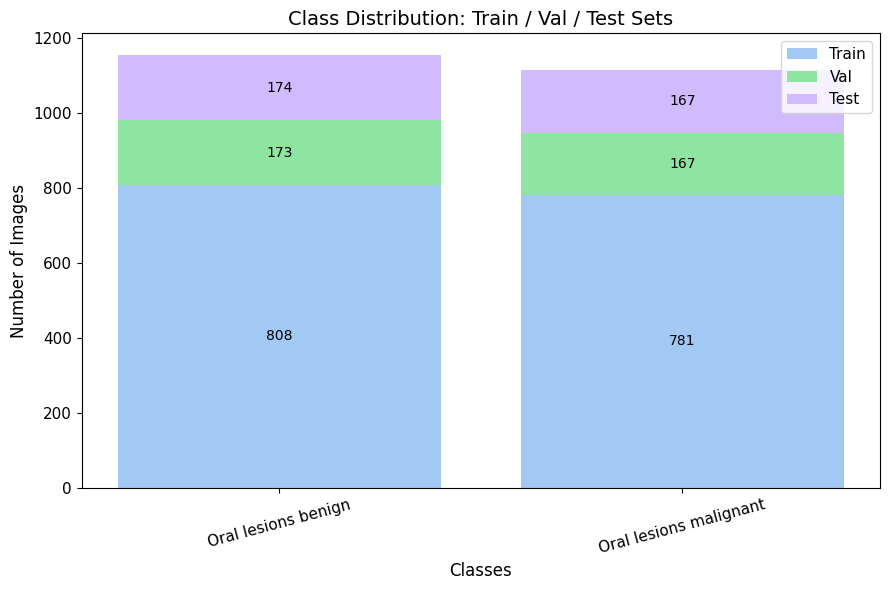

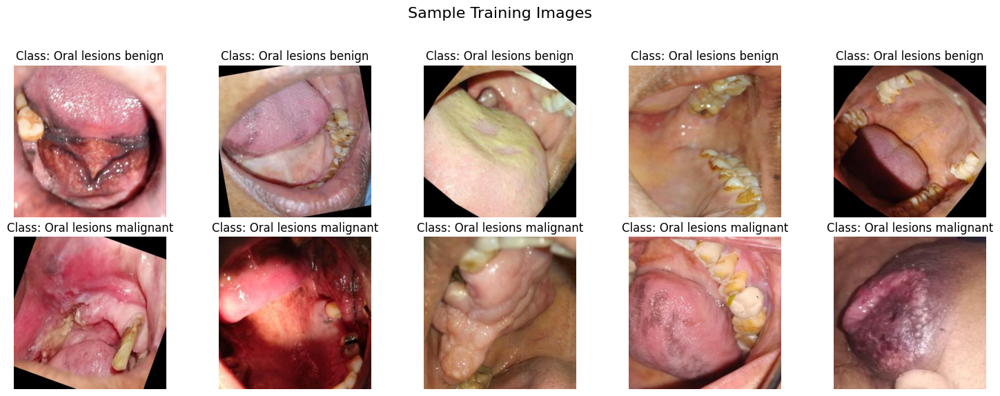

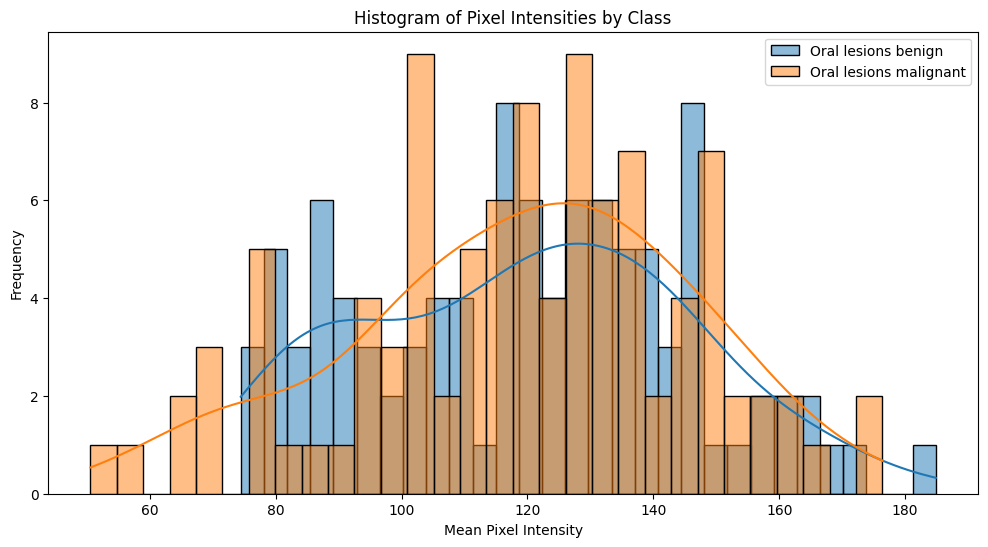


=== Training densenet121 for 50 epochs ===


Epoch 1/50: 100%|██████████| 50/50 [00:23<00:00,  2.10it/s]


[densenet121] Ep01 | TL:0.0360 TA:78.35% | VL:0.0210 VA:88.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 2/50: 100%|██████████| 50/50 [00:21<00:00,  2.30it/s]


[densenet121] Ep02 | TL:0.0217 TA:88.86% | VL:0.0109 VA:94.71%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 3/50: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]


[densenet121] Ep03 | TL:0.0138 TA:92.57% | VL:0.0105 VA:95.88%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 4/50: 100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


[densenet121] Ep04 | TL:0.0082 TA:95.53% | VL:0.0082 VA:97.06%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 5/50: 100%|██████████| 50/50 [00:23<00:00,  2.10it/s]


[densenet121] Ep05 | TL:0.0080 TA:96.60% | VL:0.0060 VA:97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 6/50: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]


[densenet121] Ep06 | TL:0.0075 TA:97.29% | VL:0.0057 VA:97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 7/50: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]


[densenet121] Ep07 | TL:0.0072 TA:97.23% | VL:0.0047 VA:98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 8/50: 100%|██████████| 50/50 [00:21<00:00,  2.28it/s]


[densenet121] Ep08 | TL:0.0069 TA:97.11% | VL:0.0048 VA:98.53%


Epoch 9/50: 100%|██████████| 50/50 [00:22<00:00,  2.27it/s]


[densenet121] Ep09 | TL:0.0060 TA:97.42% | VL:0.0037 VA:98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 10/50: 100%|██████████| 50/50 [00:23<00:00,  2.11it/s]


[densenet121] Ep10 | TL:0.0047 TA:98.80% | VL:0.0046 VA:99.12%


Epoch 11/50: 100%|██████████| 50/50 [00:22<00:00,  2.27it/s]


[densenet121] Ep11 | TL:0.0040 TA:99.18% | VL:0.0035 VA:98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 12/50: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s]


[densenet121] Ep12 | TL:0.0030 TA:99.62% | VL:0.0034 VA:98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 13/50: 100%|██████████| 50/50 [00:22<00:00,  2.23it/s]


[densenet121] Ep13 | TL:0.0033 TA:99.50% | VL:0.0040 VA:98.24%


Epoch 14/50: 100%|██████████| 50/50 [00:21<00:00,  2.35it/s]


[densenet121] Ep14 | TL:0.0039 TA:99.31% | VL:0.0029 VA:98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 15/50: 100%|██████████| 50/50 [00:22<00:00,  2.24it/s]


[densenet121] Ep15 | TL:0.0040 TA:99.24% | VL:0.0036 VA:98.82%


Epoch 16/50: 100%|██████████| 50/50 [00:22<00:00,  2.22it/s]


[densenet121] Ep16 | TL:0.0037 TA:99.37% | VL:0.0029 VA:99.12%


Epoch 17/50: 100%|██████████| 50/50 [00:21<00:00,  2.32it/s]


[densenet121] Ep17 | TL:0.0037 TA:99.18% | VL:0.0036 VA:99.12%


Epoch 18/50: 100%|██████████| 50/50 [00:21<00:00,  2.28it/s]


[densenet121] Ep18 | TL:0.0031 TA:99.37% | VL:0.0043 VA:98.53%


Epoch 19/50: 100%|██████████| 50/50 [00:21<00:00,  2.27it/s]


[densenet121] Ep19 | TL:0.0029 TA:99.56% | VL:0.0032 VA:98.82%


Epoch 20/50: 100%|██████████| 50/50 [00:21<00:00,  2.34it/s]


[densenet121] Ep20 | TL:0.0027 TA:99.87% | VL:0.0039 VA:98.82%


Epoch 21/50: 100%|██████████| 50/50 [00:21<00:00,  2.30it/s]


[densenet121] Ep21 | TL:0.0026 TA:99.69% | VL:0.0038 VA:98.82%
   -> Early stopping triggered after 21 epochs.

=== Training tf_efficientnetv2_s.in21k for 50 epochs ===


Epoch 1/50: 100%|██████████| 50/50 [00:23<00:00,  2.14it/s]


[tf_efficientnetv2_s.in21k] Ep01 | TL:0.0338 TA:80.74% | VL:0.0104 VA:95.29%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 2/50: 100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


[tf_efficientnetv2_s.in21k] Ep02 | TL:0.0116 TA:93.52% | VL:0.0068 VA:97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 3/50: 100%|██████████| 50/50 [00:23<00:00,  2.10it/s]


[tf_efficientnetv2_s.in21k] Ep03 | TL:0.0095 TA:96.60% | VL:0.0025 VA:98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 4/50: 100%|██████████| 50/50 [00:24<00:00,  2.08it/s]


[tf_efficientnetv2_s.in21k] Ep04 | TL:0.0072 TA:97.23% | VL:0.0026 VA:99.12%


Epoch 5/50: 100%|██████████| 50/50 [00:22<00:00,  2.21it/s]


[tf_efficientnetv2_s.in21k] Ep05 | TL:0.0048 TA:98.74% | VL:0.0023 VA:98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 6/50: 100%|██████████| 50/50 [00:25<00:00,  1.98it/s]


[tf_efficientnetv2_s.in21k] Ep06 | TL:0.0040 TA:99.24% | VL:0.0023 VA:98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 7/50: 100%|██████████| 50/50 [00:23<00:00,  2.10it/s]


[tf_efficientnetv2_s.in21k] Ep07 | TL:0.0034 TA:99.81% | VL:0.0021 VA:99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 8/50: 100%|██████████| 50/50 [00:24<00:00,  2.07it/s]


[tf_efficientnetv2_s.in21k] Ep08 | TL:0.0032 TA:99.62% | VL:0.0017 VA:99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 9/50: 100%|██████████| 50/50 [00:23<00:00,  2.11it/s]


[tf_efficientnetv2_s.in21k] Ep09 | TL:0.0028 TA:99.69% | VL:0.0018 VA:99.41%


Epoch 10/50: 100%|██████████| 50/50 [00:22<00:00,  2.23it/s]


[tf_efficientnetv2_s.in21k] Ep10 | TL:0.0029 TA:99.62% | VL:0.0025 VA:98.53%


Epoch 11/50: 100%|██████████| 50/50 [00:22<00:00,  2.22it/s]


[tf_efficientnetv2_s.in21k] Ep11 | TL:0.0027 TA:99.75% | VL:0.0026 VA:99.12%


Epoch 12/50: 100%|██████████| 50/50 [00:23<00:00,  2.16it/s]


[tf_efficientnetv2_s.in21k] Ep12 | TL:0.0024 TA:100.00% | VL:0.0027 VA:98.82%


Epoch 13/50: 100%|██████████| 50/50 [00:23<00:00,  2.16it/s]


[tf_efficientnetv2_s.in21k] Ep13 | TL:0.0023 TA:99.94% | VL:0.0030 VA:98.82%


Epoch 14/50: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s]


[tf_efficientnetv2_s.in21k] Ep14 | TL:0.0026 TA:99.75% | VL:0.0015 VA:99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 15/50: 100%|██████████| 50/50 [00:23<00:00,  2.10it/s]


[tf_efficientnetv2_s.in21k] Ep15 | TL:0.0024 TA:99.87% | VL:0.0014 VA:99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.in21k.pth


Epoch 16/50: 100%|██████████| 50/50 [00:24<00:00,  2.07it/s]


[tf_efficientnetv2_s.in21k] Ep16 | TL:0.0023 TA:100.00% | VL:0.0016 VA:99.12%


Epoch 17/50: 100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


[tf_efficientnetv2_s.in21k] Ep17 | TL:0.0022 TA:100.00% | VL:0.0016 VA:99.12%


Epoch 18/50: 100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


[tf_efficientnetv2_s.in21k] Ep18 | TL:0.0023 TA:100.00% | VL:0.0016 VA:99.12%


Epoch 19/50: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]


[tf_efficientnetv2_s.in21k] Ep19 | TL:0.0029 TA:99.43% | VL:0.0024 VA:98.82%


Epoch 20/50: 100%|██████████| 50/50 [00:22<00:00,  2.26it/s]


[tf_efficientnetv2_s.in21k] Ep20 | TL:0.0032 TA:99.56% | VL:0.0022 VA:99.12%


Epoch 21/50: 100%|██████████| 50/50 [00:22<00:00,  2.18it/s]


[tf_efficientnetv2_s.in21k] Ep21 | TL:0.0023 TA:99.94% | VL:0.0017 VA:99.12%


Epoch 22/50: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s]


[tf_efficientnetv2_s.in21k] Ep22 | TL:0.0027 TA:99.50% | VL:0.0018 VA:98.82%
   -> Early stopping triggered after 22 epochs.

=== Training resnet50 for 50 epochs ===


Epoch 1/50: 100%|██████████| 50/50 [00:21<00:00,  2.34it/s]


[resnet50] Ep01 | TL:0.0483 TA:73.57% | VL:0.0236 VA:87.65%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 2/50: 100%|██████████| 50/50 [00:20<00:00,  2.38it/s]


[resnet50] Ep02 | TL:0.0286 TA:83.57% | VL:0.0162 VA:90.88%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 3/50: 100%|██████████| 50/50 [00:22<00:00,  2.26it/s]


[resnet50] Ep03 | TL:0.0207 TA:86.91% | VL:0.0086 VA:95.29%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 4/50: 100%|██████████| 50/50 [00:20<00:00,  2.40it/s]


[resnet50] Ep04 | TL:0.0175 TA:89.93% | VL:0.0098 VA:95.59%


Epoch 5/50: 100%|██████████| 50/50 [00:20<00:00,  2.50it/s]


[resnet50] Ep05 | TL:0.0159 TA:92.01% | VL:0.0053 VA:97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 6/50: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]


[resnet50] Ep06 | TL:0.0139 TA:92.39% | VL:0.0057 VA:97.06%


Epoch 7/50: 100%|██████████| 50/50 [00:20<00:00,  2.43it/s]


[resnet50] Ep07 | TL:0.0110 TA:95.09% | VL:0.0053 VA:97.06%


Epoch 8/50: 100%|██████████| 50/50 [00:19<00:00,  2.57it/s]


[resnet50] Ep08 | TL:0.0102 TA:95.78% | VL:0.0054 VA:96.47%


Epoch 9/50: 100%|██████████| 50/50 [00:20<00:00,  2.42it/s]


[resnet50] Ep09 | TL:0.0078 TA:97.04% | VL:0.0049 VA:97.65%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 10/50: 100%|██████████| 50/50 [00:21<00:00,  2.30it/s]


[resnet50] Ep10 | TL:0.0078 TA:96.41% | VL:0.0034 VA:97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 11/50: 100%|██████████| 50/50 [00:21<00:00,  2.30it/s]


[resnet50] Ep11 | TL:0.0066 TA:97.67% | VL:0.0035 VA:98.24%


Epoch 12/50: 100%|██████████| 50/50 [00:19<00:00,  2.53it/s]


[resnet50] Ep12 | TL:0.0063 TA:97.48% | VL:0.0037 VA:97.94%


Epoch 13/50: 100%|██████████| 50/50 [00:21<00:00,  2.38it/s]


[resnet50] Ep13 | TL:0.0060 TA:97.67% | VL:0.0024 VA:98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 14/50: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]


[resnet50] Ep14 | TL:0.0066 TA:97.17% | VL:0.0028 VA:98.82%


Epoch 15/50: 100%|██████████| 50/50 [00:20<00:00,  2.41it/s]


[resnet50] Ep15 | TL:0.0052 TA:98.30% | VL:0.0024 VA:98.53%


Epoch 16/50: 100%|██████████| 50/50 [00:19<00:00,  2.53it/s]


[resnet50] Ep16 | TL:0.0053 TA:98.24% | VL:0.0033 VA:98.24%


Epoch 17/50: 100%|██████████| 50/50 [00:20<00:00,  2.40it/s]


[resnet50] Ep17 | TL:0.0047 TA:98.49% | VL:0.0024 VA:98.53%


Epoch 18/50: 100%|██████████| 50/50 [00:20<00:00,  2.41it/s]


[resnet50] Ep18 | TL:0.0043 TA:98.87% | VL:0.0023 VA:98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 19/50: 100%|██████████| 50/50 [00:21<00:00,  2.35it/s]


[resnet50] Ep19 | TL:0.0042 TA:99.18% | VL:0.0022 VA:98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 20/50: 100%|██████████| 50/50 [00:21<00:00,  2.32it/s]


[resnet50] Ep20 | TL:0.0041 TA:99.18% | VL:0.0020 VA:99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 21/50: 100%|██████████| 50/50 [00:21<00:00,  2.27it/s]


[resnet50] Ep21 | TL:0.0044 TA:98.87% | VL:0.0016 VA:99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 22/50: 100%|██████████| 50/50 [00:21<00:00,  2.34it/s]


[resnet50] Ep22 | TL:0.0046 TA:98.87% | VL:0.0012 VA:99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 23/50: 100%|██████████| 50/50 [00:22<00:00,  2.23it/s]


[resnet50] Ep23 | TL:0.0046 TA:98.68% | VL:0.0017 VA:99.12%


Epoch 24/50: 100%|██████████| 50/50 [00:20<00:00,  2.45it/s]


[resnet50] Ep24 | TL:0.0037 TA:99.31% | VL:0.0018 VA:99.12%


Epoch 25/50: 100%|██████████| 50/50 [00:19<00:00,  2.51it/s]


[resnet50] Ep25 | TL:0.0036 TA:99.06% | VL:0.0021 VA:98.82%


Epoch 26/50: 100%|██████████| 50/50 [00:20<00:00,  2.40it/s]


[resnet50] Ep26 | TL:0.0034 TA:99.37% | VL:0.0020 VA:98.53%


Epoch 27/50: 100%|██████████| 50/50 [00:19<00:00,  2.52it/s]


[resnet50] Ep27 | TL:0.0040 TA:98.99% | VL:0.0015 VA:99.41%


Epoch 28/50: 100%|██████████| 50/50 [00:20<00:00,  2.43it/s]


[resnet50] Ep28 | TL:0.0038 TA:99.12% | VL:0.0019 VA:99.41%


Epoch 29/50: 100%|██████████| 50/50 [00:20<00:00,  2.39it/s]


[resnet50] Ep29 | TL:0.0034 TA:99.56% | VL:0.0014 VA:99.41%
   -> Early stopping triggered after 29 epochs.

=== Training inception_v3 for 50 epochs ===


Epoch 1/50: 100%|██████████| 50/50 [00:20<00:00,  2.40it/s]


[inception_v3] Ep01 | TL:0.0449 TA:77.22% | VL:0.0145 VA:91.18%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 2/50: 100%|██████████| 50/50 [00:19<00:00,  2.51it/s]


[inception_v3] Ep02 | TL:0.0195 TA:90.18% | VL:0.0074 VA:96.47%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 3/50: 100%|██████████| 50/50 [00:21<00:00,  2.37it/s]


[inception_v3] Ep03 | TL:0.0142 TA:93.90% | VL:0.0070 VA:95.59%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 4/50: 100%|██████████| 50/50 [00:20<00:00,  2.39it/s]


[inception_v3] Ep04 | TL:0.0092 TA:96.22% | VL:0.0077 VA:96.18%


Epoch 5/50: 100%|██████████| 50/50 [00:19<00:00,  2.54it/s]


[inception_v3] Ep05 | TL:0.0083 TA:96.10% | VL:0.0043 VA:98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 6/50: 100%|██████████| 50/50 [00:20<00:00,  2.46it/s]


[inception_v3] Ep06 | TL:0.0055 TA:97.73% | VL:0.0028 VA:98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 7/50: 100%|██████████| 50/50 [00:21<00:00,  2.35it/s]


[inception_v3] Ep07 | TL:0.0060 TA:97.73% | VL:0.0043 VA:97.94%


Epoch 8/50: 100%|██████████| 50/50 [00:19<00:00,  2.52it/s]


[inception_v3] Ep08 | TL:0.0053 TA:98.36% | VL:0.0038 VA:97.94%


Epoch 9/50: 100%|██████████| 50/50 [00:19<00:00,  2.53it/s]


[inception_v3] Ep09 | TL:0.0038 TA:99.31% | VL:0.0036 VA:98.53%


Epoch 10/50: 100%|██████████| 50/50 [00:20<00:00,  2.47it/s]


[inception_v3] Ep10 | TL:0.0041 TA:99.06% | VL:0.0031 VA:98.24%


Epoch 11/50: 100%|██████████| 50/50 [00:18<00:00,  2.67it/s]


[inception_v3] Ep11 | TL:0.0046 TA:98.24% | VL:0.0031 VA:98.82%


Epoch 12/50: 100%|██████████| 50/50 [00:19<00:00,  2.60it/s]


[inception_v3] Ep12 | TL:0.0041 TA:99.06% | VL:0.0040 VA:98.53%


Epoch 13/50: 100%|██████████| 50/50 [00:19<00:00,  2.52it/s]


[inception_v3] Ep13 | TL:0.0041 TA:99.12% | VL:0.0024 VA:99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 14/50: 100%|██████████| 50/50 [00:20<00:00,  2.44it/s]


[inception_v3] Ep14 | TL:0.0041 TA:98.99% | VL:0.0042 VA:97.94%


Epoch 15/50: 100%|██████████| 50/50 [00:20<00:00,  2.48it/s]


[inception_v3] Ep15 | TL:0.0055 TA:98.49% | VL:0.0020 VA:99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 16/50: 100%|██████████| 50/50 [00:21<00:00,  2.29it/s]


[inception_v3] Ep16 | TL:0.0044 TA:98.80% | VL:0.0033 VA:98.82%


Epoch 17/50: 100%|██████████| 50/50 [00:21<00:00,  2.34it/s]


[inception_v3] Ep17 | TL:0.0046 TA:98.99% | VL:0.0024 VA:98.82%


Epoch 18/50: 100%|██████████| 50/50 [00:20<00:00,  2.47it/s]


[inception_v3] Ep18 | TL:0.0031 TA:99.56% | VL:0.0041 VA:98.53%


Epoch 19/50: 100%|██████████| 50/50 [00:19<00:00,  2.50it/s]


[inception_v3] Ep19 | TL:0.0032 TA:99.24% | VL:0.0025 VA:98.53%


Epoch 20/50: 100%|██████████| 50/50 [00:20<00:00,  2.39it/s]


[inception_v3] Ep20 | TL:0.0031 TA:99.43% | VL:0.0029 VA:98.53%


Epoch 21/50: 100%|██████████| 50/50 [00:18<00:00,  2.67it/s]


[inception_v3] Ep21 | TL:0.0031 TA:99.69% | VL:0.0017 VA:99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 22/50: 100%|██████████| 50/50 [00:21<00:00,  2.33it/s]


[inception_v3] Ep22 | TL:0.0025 TA:99.81% | VL:0.0022 VA:99.12%


Epoch 23/50: 100%|██████████| 50/50 [00:20<00:00,  2.49it/s]


[inception_v3] Ep23 | TL:0.0024 TA:99.81% | VL:0.0019 VA:99.12%


Epoch 24/50: 100%|██████████| 50/50 [00:19<00:00,  2.59it/s]


[inception_v3] Ep24 | TL:0.0024 TA:99.81% | VL:0.0026 VA:98.53%


Epoch 25/50: 100%|██████████| 50/50 [00:19<00:00,  2.52it/s]


[inception_v3] Ep25 | TL:0.0035 TA:99.43% | VL:0.0060 VA:98.24%


Epoch 26/50: 100%|██████████| 50/50 [00:19<00:00,  2.52it/s]


[inception_v3] Ep26 | TL:0.0032 TA:99.56% | VL:0.0042 VA:97.94%


Epoch 27/50: 100%|██████████| 50/50 [00:18<00:00,  2.67it/s]


[inception_v3] Ep27 | TL:0.0028 TA:99.75% | VL:0.0048 VA:98.24%


Epoch 28/50: 100%|██████████| 50/50 [00:19<00:00,  2.51it/s]


[inception_v3] Ep28 | TL:0.0030 TA:99.75% | VL:0.0059 VA:98.53%
   -> Early stopping triggered after 28 epochs.


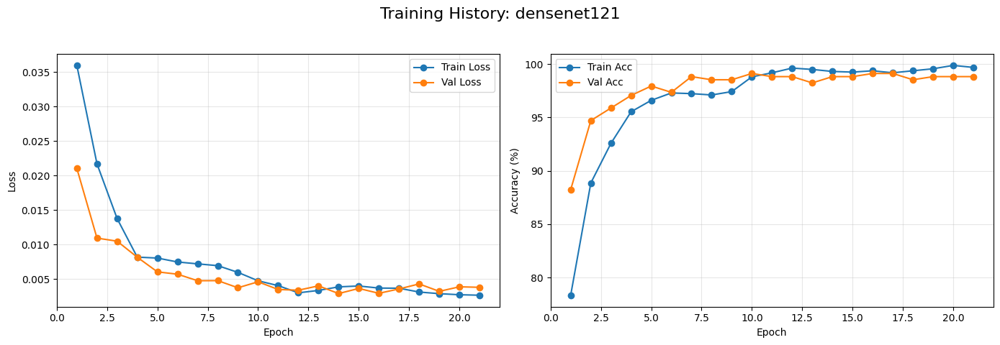

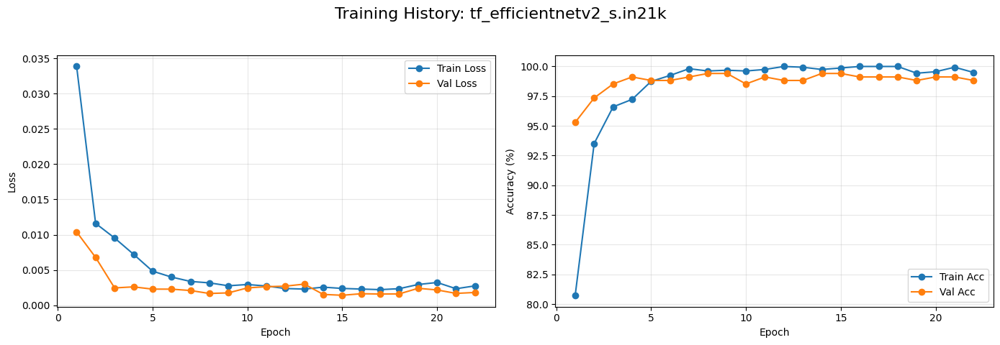

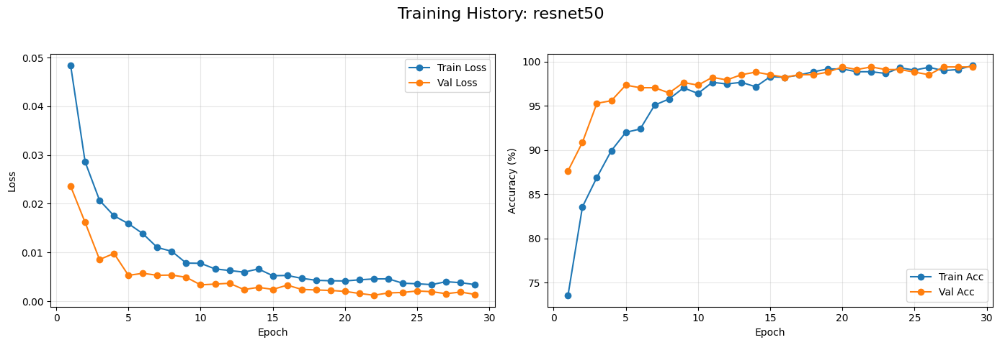

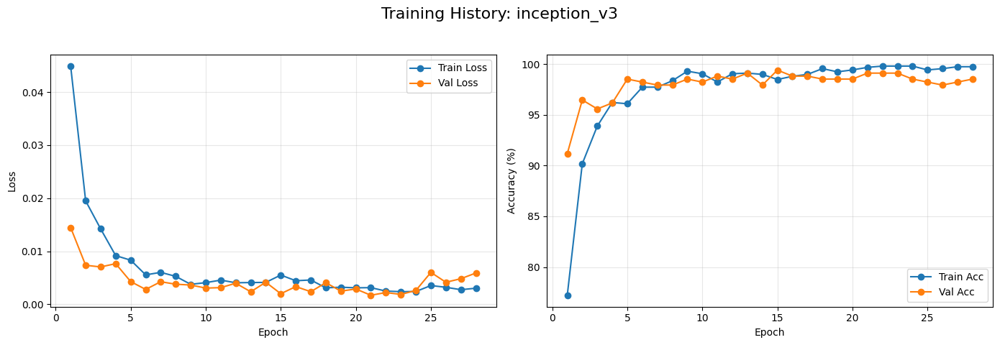


==================== Evaluating Models & Calculating Weights ====================

--- Evaluating: densenet121 ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]


   -> Test Accuracy (TTA): 97.36%


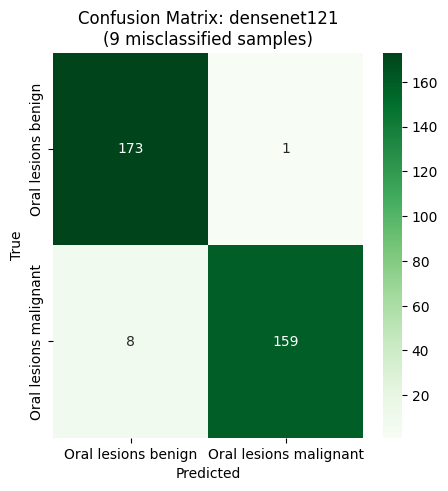


--- Evaluating: tf_efficientnetv2_s.in21k ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]


   -> Test Accuracy (TTA): 98.83%


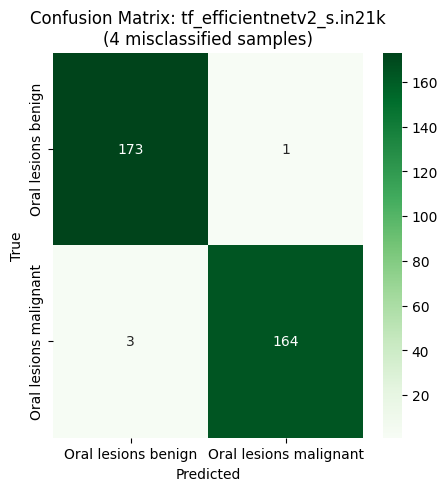


--- Evaluating: resnet50 ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]


   -> Test Accuracy (TTA): 98.53%


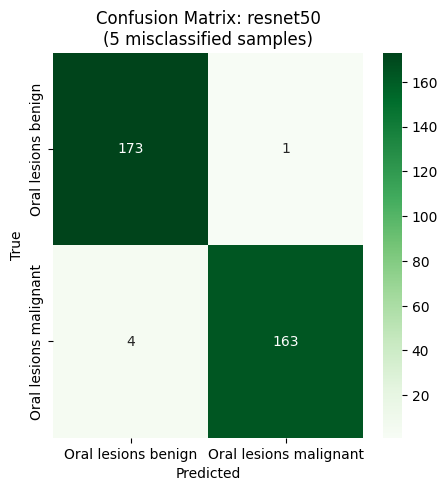


--- Evaluating: inception_v3 ---


TTA Validation: 100%|██████████| 22/22 [00:07<00:00,  3.01it/s]


   -> Test Accuracy (TTA): 98.53%


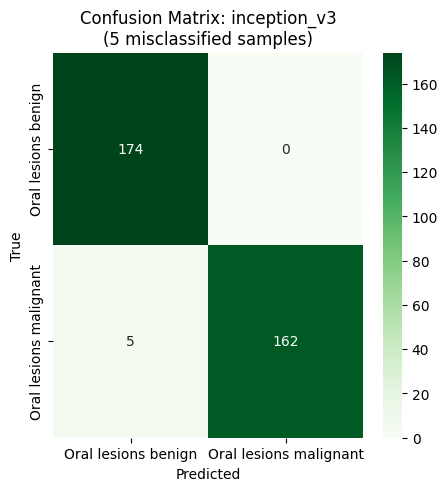


==================== Final Weighted Ensemble Evaluation ====================

Calculated Model Weights:
   - densenet121: 0.2491
   - tf_efficientnetv2_s.in21k: 0.2506
   - resnet50: 0.2506
   - inception_v3: 0.2498

==================== Final Ensemble Evaluation ====================
Ensemble Accuracy:           0.9853
Ensemble Balanced Accuracy:  0.9852
Ensemble Precision:          0.9855
Ensemble Recall:             0.9853
Ensemble F1-Score:           0.9853
Ensemble Specificity:        0.9852
Ensemble Cohen's Kappa:      0.9707
Ensemble MCC:                0.9708
Ensemble Log Loss:           0.0750
Brier Score:                 0.0129
AUC:                         0.9996

=== False-Negative Rate per Class ===
Oral lesions benign: 0.0057
Oral lesions malignant: 0.0240

--- Ensemble Classification Report (Per-Class) ---
Class                Precision    Recall  F1-Score   Support
------------------------------------------------------------
Oral lesions benign     0.9774    0.9943    0.

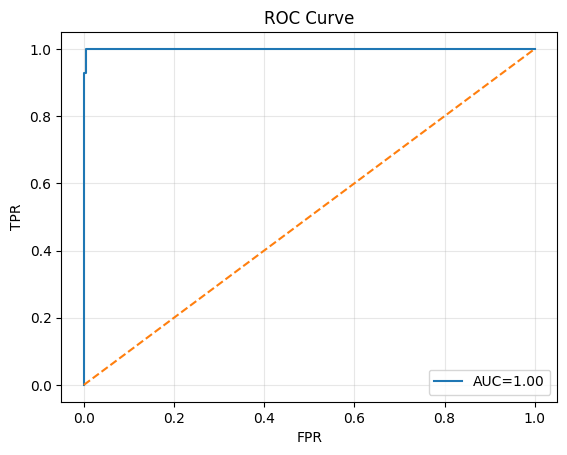

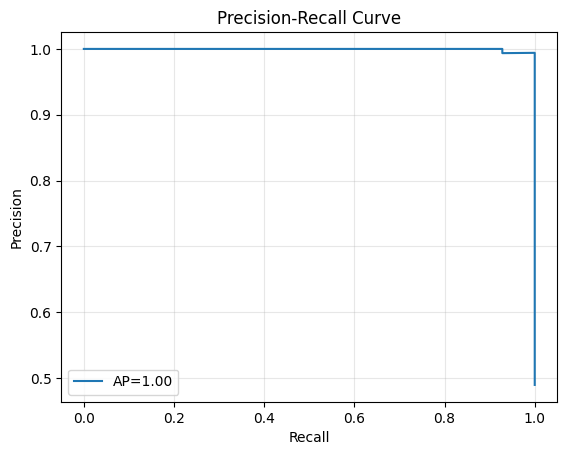

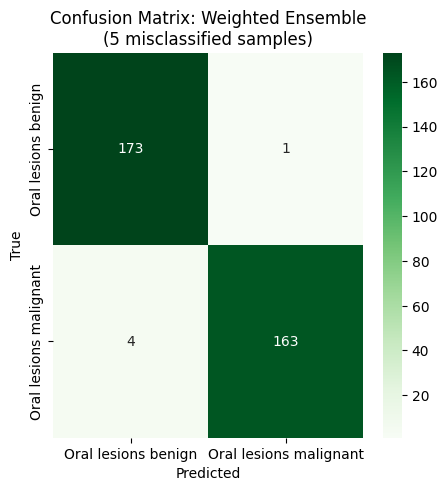



==================== LaTeX Table for Test Performance ====================
\begin{table}
\caption{Performance metrics on the test set (with TTA).}
\label{tab:model_performance}
\begin{tabular}{|l|r|rrrrrrrrrr|}
\toprule
Model & Test Loss & Accuracy & Balanced Acc & Precision & Recall & F1-Score & Specificity & Cohen's Kappa & MCC & Log Loss & Brier Score & AUC \\
\midrule
densenet121 & 0.00 & 97.36 & 97.32 & 97.44 & 97.36 & 97.36 & 97.32 & 0.95 & 0.95 & 0.09 & 0.02 & 1.00 \\
tf_efficientnetv2_s.in21k & 0.00 & 98.83 & 98.81 & 98.83 & 98.83 & 98.83 & 98.81 & 0.98 & 0.98 & 0.06 & 0.01 & 1.00 \\
resnet50 & 0.00 & 98.53 & 98.52 & 98.55 & 98.53 & 98.53 & 98.52 & 0.97 & 0.97 & 0.08 & 0.01 & 1.00 \\
inception_v3 & 0.00 & 98.53 & 98.50 & 98.57 & 98.53 & 98.53 & 98.50 & 0.97 & 0.97 & 0.08 & 0.02 & 1.00 \\
**Weighted Ensemble** & 0.00 & 98.53 & 98.52 & 98.55 & 98.53 & 98.53 & 98.52 & 0.97 & 0.97 & 0.07 & 0.01 & 1.00 \\
\bottomrule
\end{tabular}
\end{table}



==================== LaTeX Table fo

Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  7.23it/s]


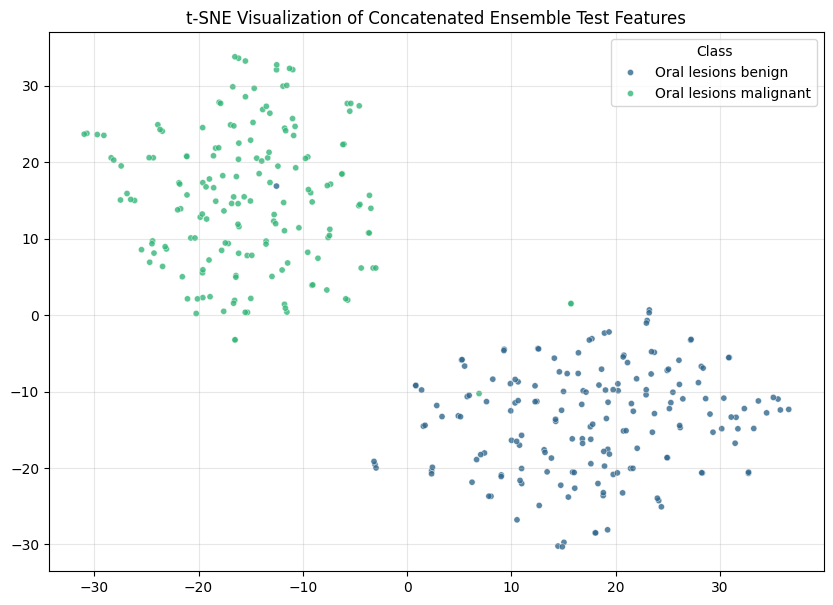


==================== Grad-CAM Visualization ====================


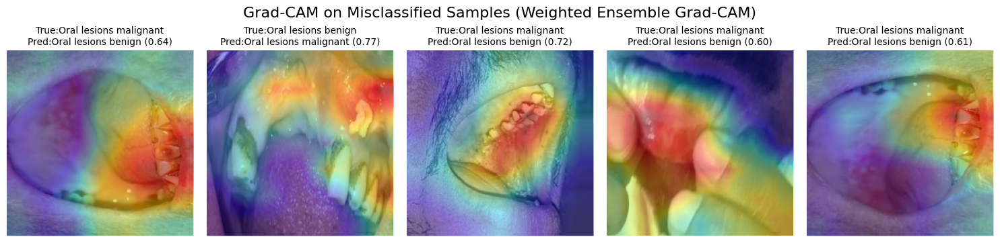

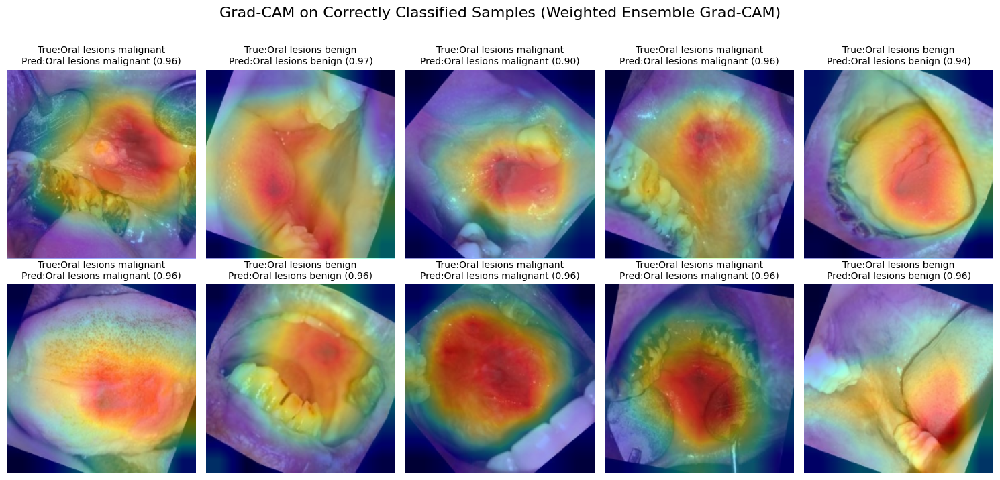


==================== Visualizing Correct & Misclassified Samples ====================
Plotting 5 misclassified images...


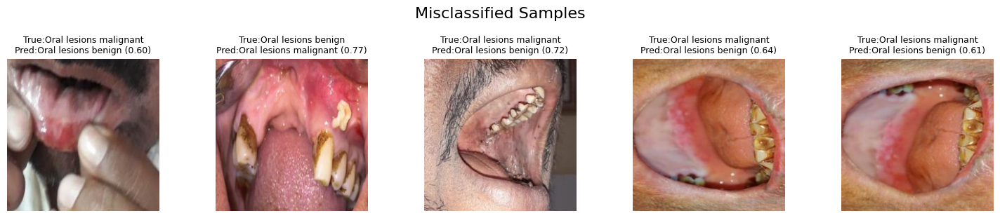

Plotting 20 correctly classified images...


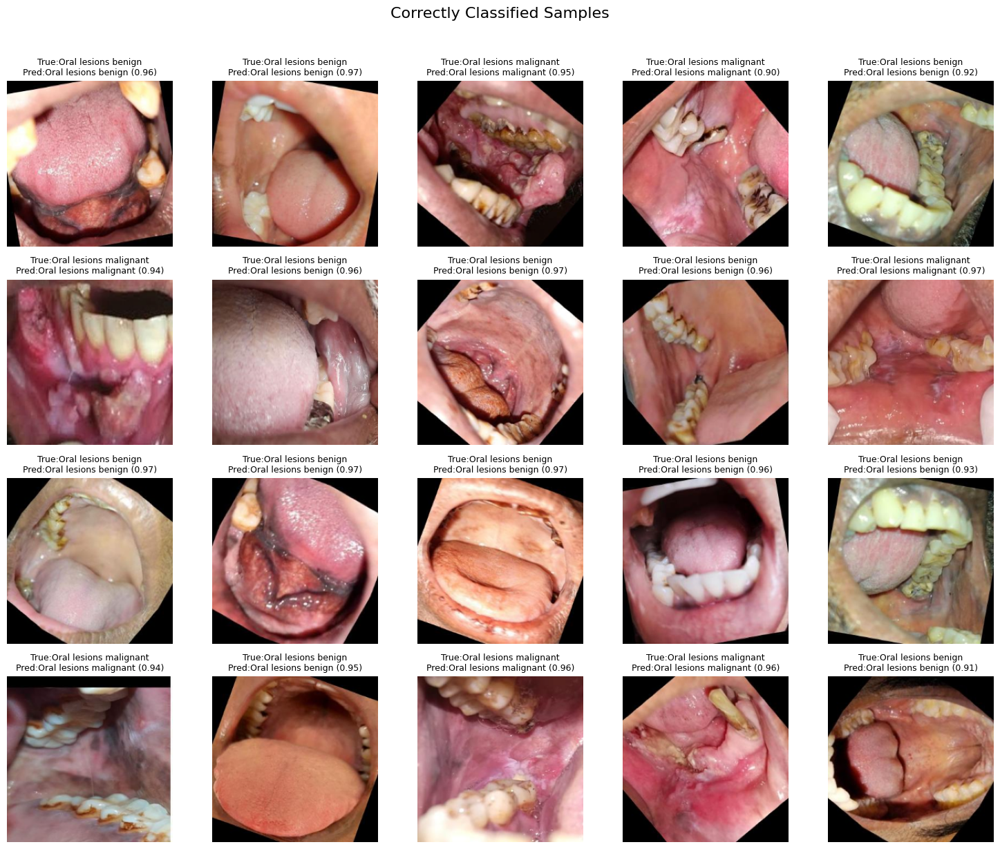

In [47]:
import os
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.metrics import (accuracy_score, balanced_accuracy_score,
                             precision_score, recall_score, f1_score,
                             confusion_matrix, classification_report,
                             cohen_kappa_score, matthews_corrcoef, log_loss,
                             roc_curve, roc_auc_score, precision_recall_curve,
                             average_precision_score, brier_score_loss)
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR
import albumentations as A
from albumentations.pytorch import ToTensorV2
import timm
import kagglehub
from tqdm import tqdm

# Download the dataset
try:
    # Attempt to download the dataset from KaggleHub
    path = kagglehub.dataset_download('mohamedgobara/oral-lesions-malignancy-detection-dataset')
    print('Data source import complete.')
except Exception as e:
    # Fallback to a placeholder path if download fails (e.g., Kaggle environment not available)
    print(f"Could not download dataset. Using a placeholder path. Error: {e}")
    path = './oral-lesions-malignancy-detection-dataset'  # Placeholder for local runs

# ------------------------------------------------------------------
# 0‒ CONFIG & GLOBALS
# ------------------------------------------------------------------
SEED = 42 # Seed for reproducibility
EPOCHS = 50 # Number of training epochs
PATIENCE = 7 # Early stopping patience
BATCH = 32 # Batch size for DataLoader
LR = 3e-4 # Learning rate
IMG_SIZE = 224 # Image size for input to models
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu') # Determine compute device
print(f"Using device: {DEVICE}")

# Define dataset directory based on the downloaded path or placeholder
DATASET_DIR = os.path.join(path, 'Oral Images Dataset', 'augmented_data')
# Ensure dataset directories exist (useful for local runs or if augmentation is done manually)
if not os.path.isdir(DATASET_DIR):
    os.makedirs(os.path.join(DATASET_DIR, 'Oral lesions benign'), exist_ok=True)
    os.makedirs(os.path.join(DATASET_DIR, 'Oral lesions malignant'), exist_ok=True)

# Directory to save trained models
SAVE_DIR = '/content/gdrive/MyDrive/Orallessions'
os.makedirs(SAVE_DIR, exist_ok=True)

CLASSES = ['Oral lesions benign', 'Oral lesions malignant'] # Class names
N_CLASSES = len(CLASSES) # Number of classes
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225) # Normalization values (ImageNet stats)
TTA_STEPS = 5 # Number of Test Time Augmentation steps
LABEL_SMOOTHING = 0.1 # Label smoothing factor for Focal Loss

# Set seeds for reproducibility across libraries
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed(SEED)

# ------------------------------------------------------------------
# 1‒ TRANSFORMS
# ------------------------------------------------------------------
# Training data augmentations
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE), # Resize images to a fixed size
    A.HorizontalFlip(p=0.5), # Random horizontal flip
    A.VerticalFlip(p=0.5), # Random vertical flip
    A.Rotate(limit=20, p=0.7), # Random rotation
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1, p=0.5), # Random color jitter
    A.CoarseDropout(max_holes=8, max_height=16, max_width=16, fill_value=0, p=0.5), # Randomly drop out rectangular regions
    A.CLAHE(p=0.3), # Contrast Limited Adaptive Histogram Equalization
    A.ElasticTransform(alpha=1, sigma=50, p=0.3), # Elastic deformations
    A.Normalize(MEAN, STD), # Normalize pixel values
    ToTensorV2(), # Convert to PyTorch tensor
])

# Validation data transforms (only resize and normalize)
val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(MEAN, STD),
    ToTensorV2(),
])

# Test Time Augmentation (TTA) transforms (different augmentations for inference)
tta_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.Normalize(MEAN, STD),
    ToTensorV2(),
])

# ------------------------------------------------------------------
# 2‒ DATASET
# ------------------------------------------------------------------
class MedicalDataset(Dataset):
    """
    Custom Dataset class for loading medical images.

    Args:
        source (str or list): Path to the dataset directory or a list of (image_path, label) tuples.
        transform (callable, optional): Optional transform to be applied on a sample.
        is_tta (bool): If True, returns multiple augmented versions of an image for TTA.
    """
    def __init__(self, source, transform=None, is_tta=False):
        self.transform = transform
        self.is_tta = is_tta
        self.class_to_idx = {cls: i for i, cls in enumerate(CLASSES)} # Mapping class names to indices

        # Load samples either from a provided list or by scanning a directory
        if isinstance(source, list):
            self.samples = source
        else:
            self.samples = []
            for lbl, cls in enumerate(sorted(os.listdir(source))):
                cls_dir = os.path.join(source, cls)
                if not os.path.isdir(cls_dir): continue # Skip if not a directory
                for fn in os.listdir(cls_dir):
                    if fn.lower().endswith(('.png', '.jpg', '.jpeg')): # Check for image file extensions
                        self.samples.append((os.path.join(cls_dir, fn), lbl))

    def __len__(self):
        """Returns the total number of samples."""
        return len(self.samples)

    def __getitem__(self, idx):
        """
        Retrieves an image and its label at the specified index.

        Args:
            idx (int): Index of the sample.

        Returns:
            tuple: (image, label) or (stacked_tta_images, label) if is_tta is True.
        """
        path, label = self.samples[idx]
        img = np.array(Image.open(path).convert('RGB')) # Load image and convert to RGB numpy array

        if self.is_tta:
            # If TTA is enabled, apply transform multiple times and stack results
            images = [self.transform(image=img)['image'] for _ in range(TTA_STEPS)]
            return torch.stack(images), label
        if self.transform:
            # Apply standard transform
            img = self.transform(image=img)['image']
        return img, label

# ------------------------------------------------------------------
# 3‒ MODEL ARCHITECTURE with ATTENTION (CNN-ONLY VERSION)
# ------------------------------------------------------------------
class SEBlock(nn.Module):
    """
    Squeeze-and-Excitation Block for CNN models.
    Enhances feature maps by modeling channel interdependencies.
    """
    def __init__(self, c, r=16):
        super().__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)  # Global average pooling
        self.excitation = nn.Sequential(
            nn.Linear(c, c // r, bias=False),    # Channel reduction
            nn.ReLU(inplace=True),
            nn.Linear(c // r, c, bias=False),    # Channel restoration
            nn.Sigmoid()                         # Channel weights
        )

    def forward(self, x):
        bs, c, _, _ = x.shape
        y = self.squeeze(x).view(bs, c)
        y = self.excitation(y).view(bs, c, 1, 1)
        return x * y.expand_as(x)  # Channel-wise scaling

class CustomModel(nn.Module):
    """
    Custom CNN model with SE attention and classification head.
    Supports: DenseNet121, EfficientNetV2, ResNet50, Inception_V3
    """
    def __init__(self, model_name='densenet121', pretrained=True):
        super().__init__()
        # Backbone initialization (CNN-only)
        self.model = timm.create_model(
            model_name,
            pretrained=pretrained,
            num_classes=0,
            global_pool=''
        )

        # Get feature dimension (all CNNs output 4D: B, C, H, W)
        with torch.no_grad():
            dummy_input = torch.randn(2, 3, IMG_SIZE, IMG_SIZE)
            self.n_features = self.model(dummy_input).shape[1]

        # Attention and pooling
        self.attention = SEBlock(self.n_features)  # Always use SEBlock for CNNs
        self.pool = nn.AdaptiveAvgPool2d(1)       # Fixed-size output

        # Classifier head
        self.classifier = nn.Sequential(
            nn.Linear(self.n_features, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.6),
            nn.Linear(512, N_CLASSES)
        )

    def forward(self, x):
        features = self.model(x)
        features = self.attention(features)      # Apply SEBlock
        pooled = self.pool(features)            # B, C, 1, 1
        flattened = torch.flatten(pooled, 1)    # B, C
        return self.classifier(flattened)

    def extract_features(self, x):
        """Feature extraction for visualization"""
        features = self.model(x)
        features = self.attention(features)
        pooled = self.pool(features)
        return torch.flatten(pooled, 1)

# ------------------------------------------------------------------
# 4‒ LOSS FUNCTION
# ------------------------------------------------------------------
class FocalLoss(nn.Module):
    """
    Focal Loss as described in 'Focal Loss for Dense Object Detection'.
    It re-weights the standard cross-entropy loss such that hard-to-classify
    examples contribute more to the loss.
    """
    def __init__(self, alpha=.25, gamma=2, label_smoothing=0.0):
        super().__init__()
        self.a, self.g, self.smoothing = alpha, gamma, label_smoothing

    def forward(self, logits, y):
        # Calculate standard Cross-Entropy Loss
        ce = F.cross_entropy(logits, y, reduction='none', label_smoothing=self.smoothing)
        # Calculate the probability of the true class
        pt = torch.exp(-ce)
        # Apply Focal Loss formula
        return (self.a * (1 - pt) ** self.g * ce).mean()

# ------------------------------------------------------------------
# 5‒ HELPER FUNCTIONS
# ------------------------------------------------------------------
def validate_epoch(model, loader, criterion, device, desc="Validation"):
    """
    Performs validation for one epoch.

    Args:
        model (nn.Module): The model to validate.
        loader (DataLoader): DataLoader for the validation set.
        criterion (nn.Module): Loss function (e.g., FocalLoss).
        device (torch.device): Device to perform computation on.
        desc (str): Description for the tqdm progress bar.

    Returns:
        tuple: (average_loss, accuracy, true_labels, predicted_labels, probabilities)
    """
    model.eval() # Set model to evaluation mode
    loss_sum, correct, total = 0., 0, 0
    ys, preds, probs = [], [], [] # Lists to store true labels, predictions, and probabilities
    with torch.no_grad(): # Disable gradient calculation for validation
        for x, y in loader:
            x, y = x.to(device), y.to(device) # Move data to the specified device
            out = model(x) # Forward pass
            # Use FocalLoss with 0 label smoothing for validation loss calculation
            val_criterion = FocalLoss(alpha=criterion.a, gamma=criterion.g, label_smoothing=0.0)
            loss = val_criterion(out, y) # Compute loss
            loss_sum += loss.item() * x.size(0) # Accumulate loss
            prob = F.softmax(out, 1) # Convert logits to probabilities
            pred = prob.argmax(1) # Get predicted class
            correct += (pred == y).sum().item() # Count correct predictions
            total += x.size(0) # Accumulate total samples
            ys.append(y.cpu()); preds.append(pred.cpu()); probs.append(prob.cpu()) # Store results
    return (loss_sum/total, correct/total,
            torch.cat(ys).numpy(), torch.cat(preds).numpy(),
            torch.cat(probs).numpy())

@torch.no_grad()
def validate_tta(model, loader, criterion, device):
    """
    Performs validation with Test Time Augmentation (TTA).
    Multiple augmented versions of each image are passed through the model,
    and their predictions are averaged.
    """
    model.eval()
    loss_sum, correct, total = 0., 0, 0
    ys, preds, probs = [], [], []
    val_criterion = FocalLoss(alpha=criterion.a, gamma=criterion.g, label_smoothing=0.0) # Validation loss without smoothing
    for x_tta, y in tqdm(loader, desc="TTA Validation"):
        y = y.to(device)
        batch_size, n_tta, c, h, w = x_tta.shape
        x_tta = x_tta.view(-1, c, h, w).to(device) # Reshape TTA inputs for batch processing
        out = model(x_tta) # Forward pass for all TTA augmented images
        prob_tta = F.softmax(out, 1).view(batch_size, n_tta, -1).mean(1) # Average probabilities across TTA steps
        pred = prob_tta.argmax(1) # Get final prediction
        avg_logits = torch.log(prob_tta.clamp(min=1e-9)) # Convert averaged probabilities back to "logits" for loss
        loss = val_criterion(avg_logits, y)
        loss_sum += loss.item() * batch_size
        correct += (pred == y).sum().item(); total += batch_size
        ys.append(y.cpu()); preds.append(pred.cpu()); probs.append(prob_tta.cpu())
    return (loss_sum / total, correct / total,
            torch.cat(ys).numpy(), torch.cat(preds).numpy(),
            torch.cat(probs).numpy())

def train_model(model, name, train_loader, val_loader, criterion, device):
    """
    Trains the given model.

    Args:
        model (nn.Module): The model to train.
        name (str): Name of the model (for saving checkpoints and logging).
        train_loader (DataLoader): DataLoader for the training set.
        val_loader (DataLoader): DataLoader for the validation set.
        criterion (nn.Module): Loss function.
        device (torch.device): Device to perform computation on.

    Returns:
        tuple: (history_dict, average_runtime_per_epoch)
    """
    opt = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4) # AdamW optimizer
    sched = CosineAnnealingLR(opt, T_max=EPOCHS, eta_min=1e-6) # Cosine Annealing learning rate scheduler
    scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda')) # Mixed precision scaler for CUDA
    best_val_loss = float('inf') # Initialize best validation loss
    patience_counter = 0 # Counter for early stopping patience
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []} # Training history
    print(f"\n=== Training {name} for {EPOCHS} epochs ===")
    start_time = time.time()
    for epoch in range(1, EPOCHS + 1):
        model.train() # Set model to training mode
        tloss, correct, total = 0., 0, 0
        for x, y in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}"):
            x, y = x.to(device), y.to(device) # Move data to device
            opt.zero_grad(set_to_none=True) # Zero gradients
            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                out = model(x) # Forward pass
                loss = criterion(out, y) # Compute loss
            scaler.scale(loss).backward() # Backward pass with scaler
            scaler.step(opt); scaler.update() # Optimizer step and scaler update
            tloss += loss.item() * x.size(0) # Accumulate training loss
            correct += (out.argmax(1) == y).sum().item() # Accumulate correct predictions
            total += x.size(0) # Accumulate total samples
        tr_loss, tr_acc = tloss/total, correct/total # Calculate average training loss and accuracy

        # Validate the model after each epoch
        val_loss, val_acc, _, _, _ = validate_epoch(model, val_loader, criterion, device, desc=f"Epoch {epoch} Val")
        history['train_loss'].append(tr_loss)
        history['train_acc'].append(tr_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f"[{name}] Ep{epoch:02d} | TL:{tr_loss:.4f} TA:{tr_acc:.2%} | VL:{val_loss:.4f} VA:{val_acc:.2%}")
        sched.step() # Update learning rate

        # Early stopping logic
        if val_loss < best_val_loss:
            best_val_loss, patience_counter = val_loss, 0
            save_path = os.path.join(SAVE_DIR, f'best_model_{name}.pth')
            torch.save(model.state_dict(), save_path) # Save the best model
            print(f"   -> Model saved to {save_path}")
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print(f"   -> Early stopping triggered after {epoch} epochs.")
                break
    end_time = time.time()
    total_time = end_time - start_time
    epochs_ran = len(history['train_loss'])
    avg_runtime = total_time / epochs_ran if epochs_ran > 0 else 0
    return history, avg_runtime

def compute_macro_specificity(cm):
    """
    Computes macro-averaged specificity from a confusion matrix.
    Specificity for a class is True Negative / (True Negative + False Positive).
    """
    tn_sum = []
    for i in range(cm.shape[0]):
        # Calculate True Negative (TN) for class i: total samples - (TP + FP + FN)
        tn = cm.sum() - (cm[i,:].sum() + cm[:,i].sum() - cm[i,i])
        # Calculate False Positive (FP) for class i: sum of column i - true positive for class i
        fp = cm[:,i].sum() - cm[i,i]
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
        tn_sum.append(specificity)
    return float(np.mean(tn_sum))

def plot_roc(y, p):
    """Plots the Receiver Operating Characteristic (ROC) curve."""
    # For binary classification, use probabilities of the positive class (index 1)
    fpr, tpr, _ = roc_curve(y, p[:,1])
    auc = roc_auc_score(y, p[:,1])
    plt.figure(); plt.plot(fpr, tpr, label=f"AUC={auc:.2f}")
    plt.plot([0,1],[0,1],'--'); plt.xlabel('FPR'); plt.ylabel('TPR')
    plt.title('ROC Curve'); plt.legend(); plt.grid(alpha=.3); plt.show()

def plot_prc(y, p):
    """Plots the Precision-Recall Curve (PRC)."""
    # For binary classification, use probabilities of the positive class (index 1)
    prec, rec, _ = precision_recall_curve(y, p[:,1])
    ap = average_precision_score(y, p[:,1])
    plt.figure(); plt.plot(rec, prec, label=f"AP={ap:.2f}")
    plt.xlabel('Recall'); plt.ylabel('Precision')
    plt.title('Precision-Recall Curve'); plt.legend(); plt.grid(alpha=.3); plt.show()

def plot_cm(y, pr, model_name=""):
    """Plots the Confusion Matrix."""
    cm = confusion_matrix(y, pr)
    misclassified = cm.sum() - np.diag(cm).sum() # Number of misclassified samples
    title = f'Confusion Matrix: {model_name}\n({misclassified} misclassified samples)'
    plt.figure(figsize=(5,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
                xticklabels=CLASSES, yticklabels=CLASSES)
    plt.xlabel('Predicted'); plt.ylabel('True')
    plt.title(title)
    plt.show()

def get_target_layer(model, model_name):
    """
    Identifies the appropriate target layer for Grad-CAM visualization
    based on the model name.
    """
    if 'densenet' in model_name:
        return model.model.features.denseblock4.denselayer16.conv2
    elif 'efficientnet' in model_name:
        return model.model.conv_head
    elif 'swin' in model_name:
        return model.model.layers[-1].blocks[-1]
    elif 'resnet' in model_name:
        return model.model.layer4[-1]
    elif 'inception' in model_name:
        return model.model.Mixed_7c
    else:
        try: # Generic attempt for other CNNs
            for layer in reversed(list(model.model.features.children())):
                if isinstance(layer, nn.Conv2d):
                    return layer
        except AttributeError:
            print("Warning: Could not automatically determine target layer for Grad-CAM.")
            return None
    print("Warning: Could not automatically determine target layer for Grad-CAM.")
    return None

def compute_gradcam(model, layer, input_tensor, class_idx, model_name):
    """
    Computes the Grad-CAM (Gradient-weighted Class Activation Mapping) heatmap.
    Visualizes regions of the input image that are important for the model's prediction.
    """
    if layer is None: return np.zeros((IMG_SIZE, IMG_SIZE)) # Return empty if no target layer
    model.eval()
    acts, grads = [], [] # Lists to store activations and gradients

    # Forward hook to capture activations
    def fwd(_, __, out): acts.append(out.detach())
    # Backward hook to capture gradients
    def bwd(_, __, grad_out): grads.append(grad_out[0].detach())

    h1 = layer.register_forward_hook(fwd)
    h2 = layer.register_full_backward_hook(bwd)

    output = model(input_tensor) # Forward pass
    score = output[:, class_idx].sum() # Get the score for the predicted class
    model.zero_grad() # Zero gradients before backward pass
    score.backward(retain_graph=True) # Backward pass to compute gradients

    # Check if hooks successfully captured data
    if not acts or not grads:
        h1.remove(); h2.remove()
        print("Warning: Grad-CAM hooks failed to capture activations or gradients.")
        return np.zeros((IMG_SIZE, IMG_SIZE))

    A = acts[0] # Activations from the target layer
    G = grads[0] # Gradients from the target layer

    if 'swin' in model_name:
        # Special handling for Swin Transformers (token-based features)
        cam = G.mean(dim=1).relu() # Mean over channels, then ReLU
        num_patches = int(np.sqrt(cam.shape[1]))
        if num_patches * num_patches != cam.shape[1]:
            print(f"Warning: Cannot form a square from sequence length {cam.shape[1]}. Grad-CAM may be incorrect.")
            cam = cam[:, :num_patches*num_patches] # Truncate if not perfectly square
        cam = cam.reshape(cam.shape[0], num_patches, num_patches) # Reshape to a 2D grid
        cam = cam.unsqueeze(1) # Add channel dimension
    else:
        # For CNNs: weight gradients by global average pooling, then multiply with activations
        weights = G.mean(dim=[2, 3], keepdim=True) # Global average pool gradients
        cam = (weights * A).sum(dim=1, keepdim=True).relu() # Weighted sum of activations, then ReLU

    h1.remove(); h2.remove() # Remove hooks to prevent memory leaks

    # Resize the CAM to the original image size and normalize
    cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
    cam = cam.squeeze().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-9) # Normalize to 0-1

    return cam

def denormalize(img_tensor):
    """
    Denormalizes an image tensor from normalized values back to original pixel range (0-1).
    Useful for displaying images after they've been normalized for model input.
    """
    mean = torch.tensor(MEAN).view(3,1,1) # Reshape mean and std for broadcasting
    std = torch.tensor(STD).view(3,1,1)
    if img_tensor.dim() == 4: img_tensor = img_tensor.squeeze(0) # Remove batch dimension if present
    img = img_tensor.cpu() * std + mean # Denormalize
    return img.permute(1,2,0).clamp(0,1).numpy() # Permute to HWC, clamp to 0-1, convert to numpy

def plot_misclassified_images(dataset, true, pred, probs, classes, num_cols=5):
    """Plots a grid of misclassified images with their true and predicted labels."""
    idxs = np.where(true != pred)[0] # Find indices where true label != predicted label
    if len(idxs) == 0:
        print("No misclassified images to display.")
        return
    print(f"Plotting {len(idxs)} misclassified images...")
    rows = (len(idxs) + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 3 * rows))
    for i, idx in enumerate(idxs):
        img, lbl = dataset[idx] # Get image and true label
        plt.subplot(rows, num_cols, i + 1)
        plt.imshow(denormalize(img)) # Display denormalized image
        plt.axis('off')
        p = pred[idx] # Predicted label
        conf = probs[idx, p] # Confidence of the predicted class
        plt.title(f"True:{classes[lbl]}\nPred:{classes[p]} ({conf:.2f})", fontsize=9)
    plt.suptitle("Misclassified Samples", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

def plot_correctly_classified_images(dataset, true, pred, probs, classes, n=20, num_cols=5):
    """Plots a random selection of correctly classified images."""
    idxs = np.where(true == pred)[0] # Find indices where true label == predicted label
    if len(idxs) == 0:
        print("No correctly classified images to display.")
        return
    n_to_plot = min(n, len(idxs)) # Limit the number of images to plot
    print(f"Plotting {n_to_plot} correctly classified images...")
    idxs_to_plot = random.sample(list(idxs), n_to_plot) # Select random correctly classified images
    rows = (len(idxs_to_plot) + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 3 * rows))
    for i, idx in enumerate(idxs_to_plot):
        img, lbl = dataset[idx]
        plt.subplot(rows, num_cols, i + 1)
        plt.imshow(denormalize(img))
        plt.axis('off')
        conf = probs[idx, lbl] # Confidence of the true class (which is also the predicted class)
        plt.title(f"True:{classes[lbl]}\nPred:{classes[lbl]} ({conf:.2f})", fontsize=9)
    plt.suptitle("Correctly Classified Samples", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

@torch.no_grad()
def extract_features(model, loader, device):
    """
    Extracts features from the model's feature extractor for all samples in a loader.
    Used for t-SNE visualization.
    """
    feats, labels = [], []
    model.eval() # Set model to evaluation mode
    for x, y in tqdm(loader, desc="Extracting Features"):
        x = x.to(device)
        f = model.extract_features(x) # Call the custom feature extraction method
        f = torch.flatten(f, 1).cpu() # Flatten and move to CPU
        feats.append(f)
        labels.append(y)
    return torch.cat(feats).numpy(), torch.cat(labels).numpy()

def plot_sample_images(dataset, title, n_per_class=5):
    """
    Plots a grid of sample images, with 'n_per_class' images for each class.
    """
    if len(dataset.samples) < n_per_class * len(CLASSES):
        print(f"Not enough samples to display {n_per_class} images per class.")
        return

    fig, axes = plt.subplots(len(CLASSES), n_per_class, figsize=(n_per_class * 3, len(CLASSES) * 3))
    fig.suptitle(title, fontsize=16)

    for class_idx, class_name in enumerate(CLASSES):
        # Filter samples for the current class
        class_samples = [s for s in dataset.samples if s[1] == class_idx]
        if len(class_samples) < n_per_class:
            print(f"Not enough samples for class {class_name}. Found {len(class_samples)}, need {n_per_class}.")
            continue
        selected_samples = random.sample(class_samples, n_per_class)

        for i, (path, lbl) in enumerate(selected_samples):
            # Handle axes indexing for single vs. multiple classes
            ax = axes[class_idx, i] if len(CLASSES) > 1 else axes[i]
            img = np.array(Image.open(path).convert('RGB'))
            ax.imshow(img)
            ax.set_title(f"Class: {class_name}")
            ax.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()


# ------------------------------------------------------------------
# 6‒ MAIN EXECUTION SCRIPT
# ------------------------------------------------------------------
def main():
    # --- 1. Data Setup ---
    all_samples = []
    # Collect all image paths and their corresponding labels
    for lbl, cls in enumerate(sorted(os.listdir(DATASET_DIR))):
        cls_path = os.path.join(DATASET_DIR, cls)
        if not os.path.isdir(cls_path): continue
        files = [os.path.join(cls_path, f) for f in os.listdir(cls_path)
                 if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        all_samples.extend([(f, lbl) for f in files])

    if not all_samples:
        print("Halting execution due to missing data. Ensure DATASET_DIR is correct.")
        return

    # Shuffle all samples for proper splitting
    rng = np.random.RandomState(SEED)
    rng.shuffle(all_samples)
    paths, labels = zip(*all_samples)

    # Split data into training, validation, and test sets with stratification
    # Split into 70% train, 30% temp (to be split into val and test)
    X_tr, X_tmp, y_tr, y_tmp = train_test_split(
        paths, labels, test_size=0.3, stratify=labels, random_state=SEED)
    # Split temp into 50% val, 50% test (0.15 each of total)
    X_va, X_te, y_va, y_te = train_test_split(
        X_tmp, y_tmp, test_size=0.5, stratify=y_tmp, random_state=SEED)

    # Convert split data back to list of tuples for Dataset creation
    tr_list = [(p, l) for p, l in zip(X_tr, y_tr)]
    va_list = [(p, l) for p, l in zip(X_va, y_va)]
    te_list = [(p, l) for p, l in zip(X_te, y_te)]

    # Create dataset objects for train, validation, and test (with and without TTA)
    train_dataset = MedicalDataset(tr_list, transform=train_transform)
    val_dataset = MedicalDataset(va_list, transform=val_transform)
    test_dataset_tta = MedicalDataset(te_list, transform=tta_transform, is_tta=True)
    test_dataset = MedicalDataset(te_list, transform=val_transform) # For non-TTA evaluation and visualization

    # Dataset for evaluating training set performance (using validation transforms)
    eval_train_dataset = MedicalDataset(tr_list, transform=val_transform)
    eval_train_loader = DataLoader(eval_train_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)

    # Create DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)
    # TTA loader typically uses a smaller batch size to manage memory due to multiple augmentations per image
    test_loader_tta = DataLoader(test_dataset_tta, batch_size=BATCH//2, shuffle=False, num_workers=0, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)

    # --- Plot Class Distribution ---
    y_train_names = np.array([CLASSES[lbl] for _, lbl in train_dataset.samples])
    y_val_names = np.array([CLASSES[lbl] for _, lbl in val_dataset.samples])
    y_test_names = np.array([CLASSES[lbl] for _, lbl in test_dataset.samples])

    def get_class_counts(labels_as_names, classes):
        return [np.sum(labels_as_names == cls) for cls in classes]

    train_counts = get_class_counts(y_train_names, CLASSES)
    val_counts = get_class_counts(y_val_names, CLASSES)
    test_counts = get_class_counts(y_test_names, CLASSES)

    x = np.arange(len(CLASSES))
    plt.figure(figsize=(9, 6))
    colors = sns.color_palette("pastel")
    train_color, val_color, test_color = colors[0], colors[2], colors[4]

    # Plot stacked bar chart for class distribution
    p1 = plt.bar(x, train_counts, color=train_color, label='Train')
    p2 = plt.bar(x, val_counts, bottom=train_counts, color=val_color, label='Val')
    p3 = plt.bar(x, test_counts, bottom=np.array(train_counts)+np.array(val_counts), color=test_color, label='Test')

    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.title('Class Distribution: Train / Val / Test Sets', fontsize=14)
    plt.xticks(x, CLASSES, rotation=15, fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(fontsize=11)

    # Add value labels on top of bars
    for counts, bars in zip([train_counts, val_counts, test_counts], [p1, p2, p3]):
        for count, bar in zip(counts, bars):
            if count > 0:
                plt.text(bar.get_x() + bar.get_width()/2, bar.get_y() + bar.get_height()/2, str(count),
                         ha='center', va='center', fontsize=10, color='black')

    plt.tight_layout()
    plt.show()

    # Plot sample images from the training dataset
    plot_sample_images(train_dataset, "Sample Training Images")

    # Histogram of pixel intensities by class
    plt.figure(figsize=(12,6))
    for i, cls_name in enumerate(CLASSES):
        # Sample up to 100 images per class for intensity analysis
        imgs = [p for p, lbl in train_dataset.samples if lbl == i][:100]
        if not imgs: continue
        # Calculate mean pixel intensity for each image (converted to grayscale)
        inten = [np.array(Image.open(p).convert('L')).mean() for p in imgs]
        if inten: sns.histplot(inten, bins=30, kde=True, label=cls_name)
    plt.title('Histogram of Pixel Intensities by Class'); plt.xlabel('Mean Pixel Intensity'); plt.ylabel('Frequency'); plt.legend(); plt.show()

    # --- 2. Model Training ---
    criterion = FocalLoss(label_smoothing=LABEL_SMOOTHING) # Initialize Focal Loss
    model_names = ['densenet121', 'tf_efficientnetv2_s.in21k', 'resnet50', 'inception_v3']
    histories = {} # To store training histories
    runtimes = {} # To store average runtime per epoch

    for model_name in model_names:
        # Initialize and train each model
        model = CustomModel(model_name=model_name, pretrained=True).to(DEVICE)
        history, avg_runtime = train_model(model, model_name, train_loader, val_loader, criterion, DEVICE)
        histories[model_name] = history
        runtimes[model_name] = avg_runtime

    # --- 3. Plotting Training Curves ---
    for model_name, history in histories.items():
        epochs_ran = len(history['train_loss'])
        if epochs_ran == 0:
            print(f"No training history for {model_name}. Skipping plot.")
            continue
        x_axis = np.arange(1, epochs_ran + 1)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
        fig.suptitle(f'Training History: {model_name}', fontsize=16)

        # Plot loss curves
        ax1.plot(x_axis, history['train_loss'], 'o-', label='Train Loss')
        ax1.plot(x_axis, history['val_loss'], 'o-', label='Val Loss')
        ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss'); ax1.legend(); ax1.grid(True, alpha=0.3)

        # Plot accuracy curves
        ax2.plot(x_axis, [acc * 100 for acc in history['train_acc']], 'o-', label='Train Acc')
        ax2.plot(x_axis, [acc * 100 for acc in history['val_acc']], 'o-', label='Val Acc')
        ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy (%)'); ax2.legend(); ax2.grid(True, alpha=0.3)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]); plt.show()

    # --- 4. Weighted Ensemble Preparation & Evaluation ---
    print("\n" + "="*20 + " Evaluating Models & Calculating Weights " + "="*20)
    # Check if any trained model files exist
    model_files_exist = any(os.path.exists(os.path.join(SAVE_DIR, f'best_model_{m}.pth')) for m in model_names)
    if not model_files_exist:
        print(f"No trained models found in {SAVE_DIR}. Halting evaluation.")
        return

    individual_results = {}
    all_train_probs, all_val_probs, all_test_probs = [], [], []
    train_true, val_true, test_true = None, None, None # To store true labels (should be consistent across models)
    val_accuracies = [] # To calculate ensemble weights

    for model_name in model_names:
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if not os.path.exists(model_path):
            print(f"Skipping evaluation for {model_name}, file not found.")
            val_accuracies.append(0) # Assign 0 weight if model not found
            continue

        print(f"\n--- Evaluating: {model_name} ---")
        # Load the best trained model for evaluation
        model = CustomModel(model_name=model_name, pretrained=False).to(DEVICE)
        model.load_state_dict(torch.load(model_path, map_location=DEVICE))

        # Evaluate on train, validation, and test sets (with TTA for test)
        # Note: train_prob, val_prob, test_prob are raw probabilities (post-softmax)
        _, _, y_train, _, train_prob = validate_epoch(model, eval_train_loader, criterion, DEVICE, desc=f"{model_name} Train Eval")
        val_loss, val_acc, y_val, _, val_prob = validate_epoch(model, val_loader, criterion, DEVICE, desc=f"{model_name} Val Eval")
        test_loss, test_acc, y_test, test_pred, test_prob = validate_tta(model, test_loader_tta, criterion, DEVICE)

        # Store true labels (they should be the same for all models)
        if train_true is None: train_true = y_train
        if val_true is None: val_true = y_val
        if test_true is None: test_true = y_test

        # Collect probabilities for ensemble
        all_train_probs.append(train_prob)
        all_val_probs.append(val_prob)
        all_test_probs.append(test_prob)
        val_accuracies.append(val_acc) # Store validation accuracy for weighting

        print(f"   -> Test Accuracy (TTA): {test_acc:.2%}")
        plot_cm(test_true, test_pred, model_name) # Plot confusion matrix for individual model

        # Calculate additional metrics for individual models
        cm = confusion_matrix(test_true, test_pred)
        brier_ind = np.mean([brier_score_loss((test_true == i).astype(int), test_prob[:, i]) for i in range(N_CLASSES)])
        # AUC for binary classification, N/A for multi-class
        auc_ind = roc_auc_score(test_true, test_prob[:, 1]) if N_CLASSES == 2 else 'N/A'
        # Calculate MCC and Log Loss for individual models
        mcc_ind = matthews_corrcoef(test_true, test_pred)
        logloss_ind = log_loss(test_true, test_prob)

        # Store individual model results
        individual_results[model_name] = {
            'Test Loss': float(test_loss),
            'Accuracy': accuracy_score(test_true, test_pred),
            'Balanced Acc': balanced_accuracy_score(test_true, test_pred),
            'Precision': precision_score(test_true, test_pred, average='weighted'),
            'Recall': recall_score(test_true, test_pred, average='weighted'),
            'F1-Score': f1_score(test_true, test_pred, average='weighted'),
            'Specificity': compute_macro_specificity(cm),
            "Cohen's Kappa": cohen_kappa_score(test_true, test_pred),
            "MCC": mcc_ind,
            "Log Loss": logloss_ind,
            "Brier Score": brier_ind,
            "AUC": auc_ind
        }

    # --- 5. Weighted Ensemble Analysis ---
    if not all_test_probs:
        print("No model outputs to ensemble. Halting.")
        return

    print("\n" + "="*20 + " Final Weighted Ensemble Evaluation " + "="*20)
    total_val_acc = sum(val_accuracies)
    if total_val_acc == 0:
        print("Warning: Could not determine model weights from validation accuracy. Using equal weights.")
        model_weights = [1/len(model_names)] * len(model_names)
    else:
        # Calculate weights based on validation accuracy
        model_weights = [acc / total_val_acc for acc in val_accuracies]

    print("\nCalculated Model Weights:")
    for name, weight in zip(model_names, model_weights):
        print(f"   - {name}: {weight:.4f}")

    def evaluate_ensemble(all_probs, y_true, weights):
        """Helper function to evaluate ensemble predictions."""
        # Average probabilities from all models using calculated weights
        avg_probs = np.average(np.array(all_probs), axis=0, weights=weights)
        # Re-normalize probabilities to ensure they sum to 1
        normalized_probs = avg_probs / np.sum(avg_probs, axis=1, keepdims=True)
        preds = np.argmax(normalized_probs, axis=1) # Get ensemble predictions

        # Calculate ensemble loss (using log probabilities for consistency with FocalLoss)
        val_criterion = FocalLoss(alpha=criterion.a, gamma=criterion.g, label_smoothing=0.0)
        # Convert numpy array to torch tensor, log transform for CE-like loss
        logits = torch.log(torch.tensor(normalized_probs, dtype=torch.float32, device=DEVICE).clamp(min=1e-9))
        labels = torch.tensor(y_true, dtype=torch.long, device=DEVICE)
        with torch.no_grad():
            loss = val_criterion(logits, labels).item()
        acc = accuracy_score(y_true, preds)
        return loss, acc, normalized_probs, preds

    # Evaluate ensemble on training, validation, and test sets
    ens_train_loss, ens_train_acc, _, _ = evaluate_ensemble(all_train_probs, train_true, model_weights)
    ens_val_loss, ens_val_acc, _, _ = evaluate_ensemble(all_val_probs, val_true, model_weights)
    ens_test_loss, ens_test_acc, ens_test_probs, ens_test_preds = evaluate_ensemble(all_test_probs, test_true, model_weights)

    # Calculate final ensemble metrics
    balanced_acc = balanced_accuracy_score(test_true, ens_test_preds)
    precision_val = precision_score(test_true, ens_test_preds, average='weighted')
    recall_val = recall_score(test_true, ens_test_preds, average='weighted')
    f1_val = f1_score(test_true, ens_test_preds, average='weighted')
    kappa = cohen_kappa_score(test_true, ens_test_preds)
    mcc = matthews_corrcoef(test_true, ens_test_preds)
    logloss_val = log_loss(test_true, ens_test_probs)
    cm_ensemble = confusion_matrix(test_true, ens_test_preds)
    specificity = compute_macro_specificity(cm_ensemble)
    brier_score_val = np.mean([brier_score_loss((test_true == i).astype(int), ens_test_probs[:, i]) for i in range(N_CLASSES)])
    auc_val = roc_auc_score(test_true, ens_test_probs[:, 1]) if N_CLASSES == 2 else 'N/A'

    # Calculate False Negative Rate per class
    fn = cm_ensemble.sum(axis=1) - np.diag(cm_ensemble)
    tp = np.diag(cm_ensemble)
    fnr = fn / (fn + tp) if (fn + tp).all() > 0 else np.zeros_like(fn, dtype=float) # Handle division by zero

    print("\n==================== Final Ensemble Evaluation ====================")
    print(f"Ensemble Accuracy:           {ens_test_acc:.4f}")
    print(f"Ensemble Balanced Accuracy:  {balanced_acc:.4f}")
    print(f"Ensemble Precision:          {precision_val:.4f}")
    print(f"Ensemble Recall:             {recall_val:.4f}")
    print(f"Ensemble F1-Score:           {f1_val:.4f}")
    print(f"Ensemble Specificity:        {specificity:.4f}")
    print(f"Ensemble Cohen's Kappa:      {kappa:.4f}")
    print(f"Ensemble MCC:                {mcc:.4f}")
    print(f"Ensemble Log Loss:           {logloss_val:.4f}")
    print(f"Brier Score:                 {brier_score_val:.4f}")
    print(f"AUC:                         {auc_val:.4f}")

    print("\n=== False-Negative Rate per Class ===")
    for i, cls_name in enumerate(CLASSES):
        print(f"{cls_name}: {fnr[i]:.4f}")

    print("\n--- Ensemble Classification Report (Per-Class) ---")
    # Get the classification report as a dictionary
    report_dict = classification_report(test_true, ens_test_preds, target_names=CLASSES, digits=4, output_dict=True)

    # Manually format and print the report, excluding 'accuracy', 'macro avg', and 'weighted avg'
    # Define the header for the classification report
    header = "{:<20} {:>9} {:>9} {:>9} {:>9}".format("Class", "Precision", "Recall", "F1-Score", "Support")
    print(header)
    print("-" * len(header))

    # Print metrics for each class
    for class_name in CLASSES:
        if class_name in report_dict:
            metrics = report_dict[class_name]
            print("{:<20} {:>9.4f} {:>9.4f} {:>9.4f} {:>9}".format(
                class_name,
                metrics['precision'],
                metrics['recall'],
                metrics['f1-score'],
                metrics['support']
            ))


    # Plot evaluation curves and confusion matrix for the ensemble
    plot_roc(test_true, ens_test_probs)
    plot_prc(test_true, ens_test_probs)
    plot_cm(test_true, ens_test_preds, "Weighted Ensemble")

    # --- 6. Generate LaTeX tables ---
    # Create DataFrame for individual and ensemble test performance
    df_results = pd.DataFrame.from_dict(individual_results, orient='index').reset_index().rename(columns={'index':'Model'})
    ensemble_results_entry = {
        'Model': '**Weighted Ensemble**',
        'Test Loss': ens_test_loss, 'Accuracy': ens_test_acc,
        'Balanced Acc': balanced_acc, 'Precision': precision_val,
        'Recall': recall_val, 'F1-Score': f1_val,
        'Specificity': specificity, "Cohen's Kappa": kappa,
        "MCC": mcc,
        "Log Loss": logloss_val,
        'Brier Score': brier_score_val, 'AUC': auc_val
    }
    ensemble_results_df = pd.DataFrame([ensemble_results_entry])
    df_results = pd.concat([df_results, ensemble_results_df], ignore_index=True)

    # Convert percentage metrics to percentage for display in table
    for col in ['Accuracy', 'Balanced Acc', 'Precision', 'Recall', 'F1-Score', 'Specificity']:
        df_results[col] = df_results[col] * 100

    # Define the desired column order for the LaTeX table
    results_col_order = [
        'Model', 'Test Loss', 'Accuracy', 'Balanced Acc', 'Precision', 'Recall',
        'F1-Score', 'Specificity', "Cohen's Kappa", "MCC", "Log Loss", 'Brier Score', 'AUC'
    ]
    df_results = df_results[results_col_order]

    print("\n\n" + "="*20 + " LaTeX Table for Test Performance " + "="*20)
    # Generate LaTeX table for test performance metrics
    print(df_results.to_latex(index=False,
                             caption="Performance metrics on the test set (with TTA).",
                             label="tab:model_performance",
                             float_format="%.2f",
                             column_format="|l|r|rrrrrrrrrr|"))

    # Create DataFrame for training summary (last epoch values)
    training_summary_results = {}
    for model_name, history in histories.items():
        if not history['train_loss']: continue # Skip if no training history
        training_summary_results[model_name] = {
            'Train Loss': history['train_loss'][-1],
            'Val Loss': history['val_loss'][-1],
            'Train Acc': history['train_acc'][-1] * 100,
            'Val Acc': history['val_acc'][-1] * 100,
            'Avg Runtime (s)': runtimes.get(model_name, 0)
        }
    df_summary = pd.DataFrame.from_dict(training_summary_results, orient='index').reset_index().rename(columns={'index':'Model'})
    ensemble_summary_entry = {
        'Model': '**Weighted Ensemble**',
        'Train Loss': ens_train_loss, 'Val Loss': ens_val_loss,
        'Train Acc': ens_train_acc * 100, 'Val Acc': ens_val_acc * 100,
        'Avg Runtime (s)': 'N/A' # Ensemble does not have a training runtime
    }
    ensemble_summary_df = pd.DataFrame([ensemble_summary_entry])
    df_summary = pd.concat([df_summary, ensemble_summary_df], ignore_index=True)

    print("\n\n" + "="*20 + " LaTeX Table for Training Summary " + "="*20)
    # Generate LaTeX table for training summary
    print(df_summary.to_latex(index=False,
                             caption="Training and validation performance with average runtime per epoch.",
                             label="tab:training_summary",
                             float_format="%.2f",
                             column_format="|l|rr|rr|r|"))

    # --- 7. t-SNE Visualization (Ensemble) ---
    print("\nGenerating Ensemble t-SNE plot...")
    tsne_features_list = []
    tsne_labels = None
    # Extract features from each model for t-SNE
    for model_name in model_names:
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if os.path.exists(model_path):
            model = CustomModel(model_name=model_name, pretrained=False).to(DEVICE)
            model.load_state_dict(torch.load(model_path, map_location=DEVICE))
            feats, lbls = extract_features(model, test_loader, DEVICE)
            tsne_features_list.append(feats)
            if tsne_labels is None: tsne_labels = lbls # True labels for t-SNE plot

    if tsne_features_list:
        # Concatenate features from all models for ensemble t-SNE
        ensemble_features_concat = np.concatenate(tsne_features_list, axis=1)
        # Run t-SNE
        # Perplexity should be less than the number of samples
        tsne = TSNE(n_components=2, random_state=SEED, perplexity=min(30, len(ensemble_features_concat)-1)).fit_transform(ensemble_features_concat)
        plt.figure(figsize=(10,7))
        sns.scatterplot(x=tsne[:,0], y=tsne[:,1], hue=[CLASSES[l] for l in tsne_labels],
                        palette='viridis', s=20, alpha=0.8)
        plt.title('t-SNE Visualization of Concatenated Ensemble Test Features')
        plt.legend(title='Class'); plt.grid(alpha=0.3); plt.show()
    else:
        print("Skipping t-SNE plot as no model features were extracted.")

    # --- 8. Grad-CAM and Additional Visualizations (Ensemble) ---
    print("\n" + "="*20 + " Grad-CAM Visualization " + "="*20)
    ensemble_models = []
    # Load all trained models for Grad-CAM visualization
    for model_name in model_names:
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if os.path.exists(model_path):
            model = CustomModel(model_name=model_name, pretrained=False).to(DEVICE)
            model.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model.eval()
            ensemble_models.append({'name': model_name, 'model': model})

    if not ensemble_models:
        print("No models loaded for Grad-CAM. Skipping.")
    else:
        # Select a few misclassified and correctly classified samples for Grad-CAM
        mis_idx = np.where(test_true != ens_test_preds)[0].tolist()
        cor_idx = np.where(test_true == ens_test_preds)[0].tolist()
        random.shuffle(mis_idx); random.shuffle(cor_idx)
        mis_idx = mis_idx[:min(10, len(mis_idx))] # Take up to 10 misclassified
        cor_idx = cor_idx[:min(10, len(cor_idx))] # Take up to 10 correctly classified

        def gradcam_panel_ensemble(idxs, title_prefix, models_info, avg_probs, preds):
            """
            Plots a panel of images with overlaid ensemble Grad-CAM heatmaps.
            """
            if not idxs:
                print(f"No samples for Grad-CAM panel: {title_prefix}")
                return
            rows = (len(idxs) + 4) // 5 # Determine number of rows for the plot grid
            fig, axes = plt.subplots(rows, 5, figsize=(15, 3.5 * rows))
            axes = axes.flatten() # Flatten the axes array for easy iteration
            fig.suptitle(f"{title_prefix} (Weighted Ensemble Grad-CAM)", fontsize=16, y=1.02)

            for i, idx in enumerate(idxs):
                ax = axes[i]
                img_tensor, true_label = test_dataset[idx] # Get image and true label
                input_tensor = img_tensor.unsqueeze(0).to(DEVICE) # Add batch dimension and move to device
                pred_label = preds[idx] # Ensemble predicted label
                conf = avg_probs[idx, pred_label] # Confidence of ensemble prediction

                heatmaps = []
                for model_info in models_info:
                    model = model_info['model']
                    model_name = model_info['name']
                    target_layer = get_target_layer(model, model_name) # Get model-specific target layer
                    if target_layer:
                        heatmap = compute_gradcam(model, target_layer, input_tensor, pred_label, model_name)
                        heatmaps.append(heatmap) # Collect heatmaps from individual models

                ax.imshow(denormalize(img_tensor)) # Display original image
                if heatmaps:
                    # Average heatmaps from all models for an "ensemble" heatmap
                    ensemble_heatmap = np.mean(heatmaps, axis=0)
                    ax.imshow(ensemble_heatmap, cmap='jet', alpha=0.4, extent=(0, IMG_SIZE, IMG_SIZE, 0)) # Overlay heatmap
                    ax.set_title(f"True:{CLASSES[true_label]}\nPred:{CLASSES[pred_label]} ({conf:.2f})", fontsize=10)
                else:
                    ax.set_title(f"True:{CLASSES[true_label]}\nPred:{CLASSES[pred_label]}\n(CAM FAILED)", fontsize=9)
                ax.axis('off') # Turn off axis ticks

            # Hide any unused subplots
            for j in range(len(idxs), len(axes)):
                axes[j].axis('off')
            plt.tight_layout(rect=[0, 0, 1, 0.98], h_pad=3)
            plt.show()

        # Plot Grad-CAM for selected misclassified and correctly classified samples
        gradcam_panel_ensemble(mis_idx, "Grad-CAM on Misclassified Samples", ensemble_models, ens_test_probs, ens_test_preds)
        gradcam_panel_ensemble(cor_idx, "Grad-CAM on Correctly Classified Samples", ensemble_models, ens_test_probs, ens_test_preds)

    # --- 9. Final Image Visualizations ---
    print("\n" + "="*20 + " Visualizing Correct & Misclassified Samples " + "="*20)
    # Plot grids of misclassified and correctly classified images (without Grad-CAM overlay)
    plot_misclassified_images(test_dataset, test_true, ens_test_preds, ens_test_probs, CLASSES)
    plot_correctly_classified_images(test_dataset, test_true, ens_test_preds, ens_test_probs, CLASSES, n=20)

if __name__ == "__main__":
    main()
